In [1]:
from IPython.display import display, HTML, Image
display(HTML("<style>.container { width:95% !important; }</style>"))

%load_ext autoreload
%autoreload 2

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import os
import copy
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import networkx as nx
import phate
import scvelo as scv

import matplotlib
from matplotlib import cm
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects
import scipy.cluster.hierarchy
from scipy.spatial.distance import cdist, pdist, squareform
from scipy import ndimage
from scipy.sparse import csr_matrix
import scipy.stats
from sklearn.cluster import KMeans


from scanpy.tools._score_genes import score_genes

from scipy.interpolate import UnivariateSpline
from scipy.ndimage import gaussian_filter

import sys
sys.path.append("../../lib")
#from stpalette import palette1
from utils import loadCNVfromCaSpER, loadCNVfromInferCNV
from stpalette import palette_WM4007_rna, palette_WM4237_rna
from vplot import wrapVplotRatio, wrapVplotScore, wrapVplotGene

# pip install scFates --user
import scFates as scf
# pip install palantir --user
import palantir
# conda install -c conda-forge -y mscorefonts

from pathways import genesDicts
from plots import plotSpatialAll

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


Loading pathways from : C:\Projects\A_ST\github-pipelines\PDX-melanoma-integrated-analysis\pathways/


In [2]:
model = 'WM4237'
palette_rna = palette_WM4007_rna if model=='WM4007' else palette_WM4237_rna
palette_rna.update({True: 'grey', False: 'crimson'})

dataPath = '../../data/'
preprocessedInferCNVDataPath = f'c:/Projects/A_ST/inferCNV_results_{model}/'
preprocessedStDataPath = f'd:/from HPCC 11 28 2022/results_NF1-nod-t2t-k35/{model}/'

ids = sorted(np.loadtxt(dataPath + 'ids_%s_ST.txt' % model, dtype=str))
sids = [id[7:12] for id in ids]

In [3]:
ad_all = sc.read(dataPath + 'ad_all_human_clustered_st_%s.h5ad' % model)
print(ad_all.shape)

(18406, 18720)


In [4]:
ad_all = ad_all[ad_all.obs['human_ratio'] > 0.25]
print(ad_all.shape)

(18406, 18720)


In [5]:
def inferOrderingCurve(ad, referenceGene='CCND1', nCPUs=6, harmony_batch_variable='sample', min_spots_harmonize=100, use_diffusion_space=False):
    
    sc.pp.highly_variable_genes(ad, flavor='seurat', batch_key='sample', n_top_genes=200)
    sc.pp.pca(ad, n_comps=30, zero_center=True, use_highly_variable=True)
    
    rep = 'X_pca'
    if ad.shape[0] >= min_spots_harmonize:
        sce.pp.harmony_integrate(ad, harmony_batch_variable)
        rep = 'X_pca_harmony'
    
    if use_diffusion_space:
        # Generate neighbor draph in multiscale diffusion space
        ad.obsm['X_palantir'] = palantir.utils.determine_multiscale_space(palantir.utils.run_diffusion_maps(pd.DataFrame(ad.obsm[rep], index=ad.obs_names)), n_eigs=10).values
        sc.pp.neighbors(ad, n_neighbors=100, use_rep='X_palantir', metric='correlation')

        scf.tl.curve(ad, Nodes=10, use_rep='X_palantir', seed=1)
    else:
        sc.pp.neighbors(ad, use_rep=rep)
        sc.tl.umap(ad)

        scf.tl.curve(ad, Nodes=10, use_rep='X_umap', ndims_rep=2)

    scf.tl.root(ad, referenceGene, tips_only=True) 
    scf.tl.convert_to_soft(ad, 1, 1000)
    
    scf.tl.pseudotime(ad, n_jobs=nCPUs, n_map=100, seed=42)

    return ad

In [6]:
ad = ad_all[ad_all.obs['T']=='T4'].copy()
ad.shape

(3253, 18720)

In [7]:
ad_dif = inferOrderingCurve(ad, use_diffusion_space=True)

2023-07-13 16:40:42,374 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-07-13 16:40:44,482 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-07-13 16:40:44,528 - harmonypy - INFO - Iteration 1 of 10
2023-07-13 16:40:45,851 - harmonypy - INFO - Iteration 2 of 10
2023-07-13 16:40:47,114 - harmonypy - INFO - Iteration 3 of 10
2023-07-13 16:40:48,258 - harmonypy - INFO - Iteration 4 of 10
2023-07-13 16:40:49,327 - harmonypy - INFO - Iteration 5 of 10
2023-07-13 16:40:49,782 - harmonypy - INFO - Iteration 6 of 10
2023-07-13 16:40:50,137 - harmonypy - INFO - Iteration 7 of 10
2023-07-13 16:40:50,536 - harmonypy - INFO - Converged after 7 iterations


Determing nearest neighbor graph...
inferring a principal curve --> parameters used 
    10 principal points, mu = 0.1, lambda = 0.01
    finished (0:00:01) --> added 
    .uns['epg'] dictionnary containing inferred elastic curve generated from elpigraph.
    .obsm['X_R'] hard assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'], coordinates of principal points in representation space.
automatic root selection using CCND1 values
node 2 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
Converting R into soft assignment matrix
    finished (0:00:00) --> updated 
    .obsm['X_R'] converted soft assignment of cells to principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.
projecting cells onto the principal gra

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.


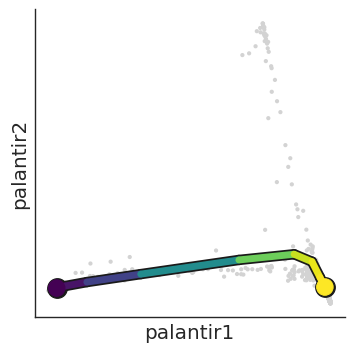

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

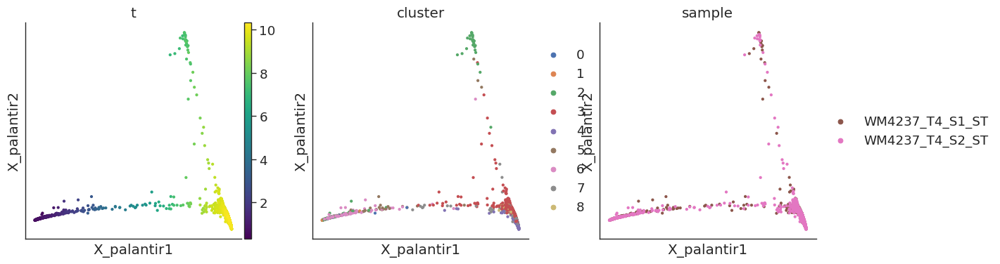

In [8]:
scf.pl.trajectory(ad_dif, basis='palantir')
sc.pl.embedding(ad_dif, color=['t', 'cluster', 'sample'], basis='X_palantir', cmap='viridis')

In [17]:
ad_umap = inferOrderingCurve(ad)

2023-07-13 15:07:57,566 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-07-13 15:07:58,488 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-07-13 15:07:58,514 - harmonypy - INFO - Iteration 1 of 10
2023-07-13 15:07:59,207 - harmonypy - INFO - Iteration 2 of 10
2023-07-13 15:07:59,845 - harmonypy - INFO - Iteration 3 of 10
2023-07-13 15:08:00,518 - harmonypy - INFO - Iteration 4 of 10
2023-07-13 15:08:01,161 - harmonypy - INFO - Iteration 5 of 10
2023-07-13 15:08:01,434 - harmonypy - INFO - Iteration 6 of 10
2023-07-13 15:08:01,639 - harmonypy - INFO - Iteration 7 of 10
2023-07-13 15:08:01,876 - harmonypy - INFO - Converged after 7 iterations


inferring a principal curve --> parameters used 
    10 principal points, mu = 0.1, lambda = 0.01
    finished (0:00:00) --> added 
    .uns['epg'] dictionnary containing inferred elastic curve generated from elpigraph.
    .obsm['X_R'] hard assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'], coordinates of principal points in representation space.
automatic root selection using CCND1 values
node 2 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
Converting R into soft assignment matrix
    finished (0:00:00) --> updated 
    .obsm['X_R'] converted soft assignment of cells to principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.
projecting cells onto the principal graph
    mappings: 100%|██████████████

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.


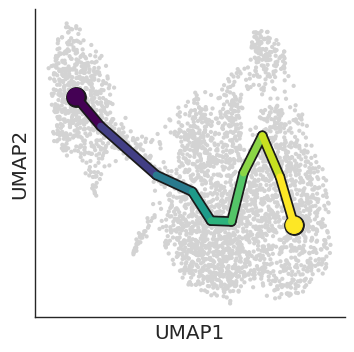

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: Font family 'Bitstream Vera Sans' not found.
findfont: 

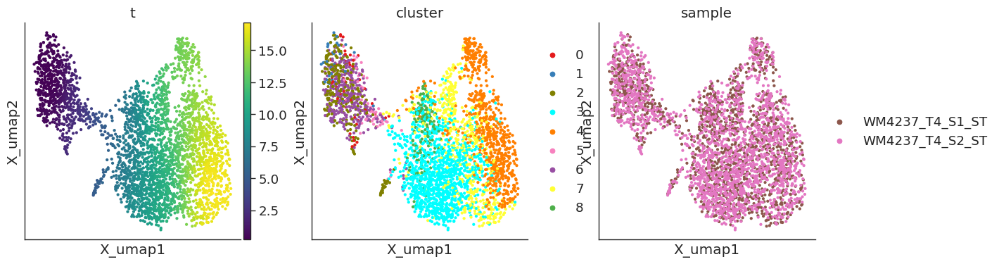

In [20]:
scf.pl.trajectory(ad_umap, basis='umap')
sc.pl.embedding(ad_umap, color=['t', 'cluster', 'sample'], basis='X_umap', cmap='viridis')

In [25]:
ribo_sum = np.exp(ad_all[:, ad_all.var.index.intersection(genesDicts['RIBOSOMAL'])].to_df()).sub(1.).sum(axis=1).values
other_sum = np.exp(ad_all[:, ad_all.var.index.difference(genesDicts['RIBOSOMAL'])].to_df()).sub(1.).sum(axis=1).values

ad_all.obs['ribosomal_fraction'] = ribo_sum / other_sum

In [26]:
ads = {id: ad_all[ad_all.obs['sample']==id, :] for id in ids}
images = {id: sc.read(preprocessedStDataPath + '%s/st_adata_processed.h5ad' % id).uns['spatial'] for id in ids}
for sample in ids[:]:
    ads[sample] = ad_all[ad_all.obs['sample']==sample, :].copy()    
    ads[sample].uns['spatial'] = images[sample]

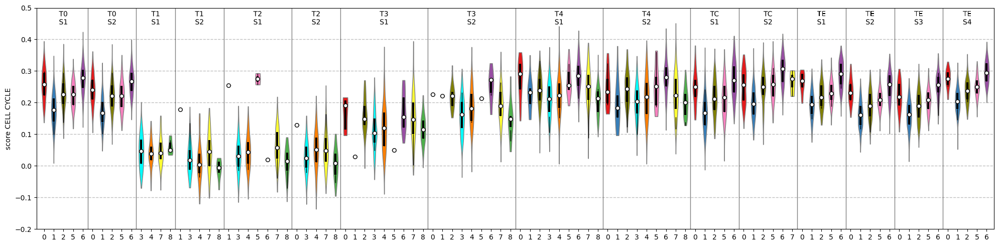

In [29]:
for geneset in ['CELL_CYCLE']:
    wrapVplotScore(geneset, genesDicts=genesDicts, identity='cluster', palette=palette_rna, ads=ads, ids=ids)

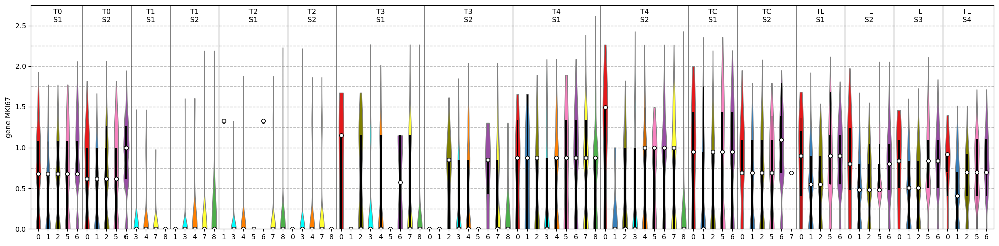

In [30]:
wrapVplotGene('MKI67', identity='cluster', palette=palette_rna, ads=ads, ids=ids)

In [31]:
for id in ids:
    ad = ads[id]
    print(id, '\t', scipy.stats.pearsonr(ad.obs['score_CELL_CYCLE'].values, ad[:, 'MKI67'].to_df().T.values[0]).statistic)

WM4237_T0_S1_ST 	 0.25013718575259014
WM4237_T0_S2_ST 	 0.2610720550724344
WM4237_T1_S1_ST 	 0.06529673583335951
WM4237_T1_S2_ST 	 -0.005351458115470841
WM4237_T2_S1_ST 	 0.05594071424589691
WM4237_T2_S2_ST 	 0.05862362655430078
WM4237_T3_S1_ST 	 0.0958606107802696
WM4237_T3_S2_ST 	 0.2753236917355308
WM4237_T4_S1_ST 	 0.12304359732701917
WM4237_T4_S2_ST 	 0.15437553976587487
WM4237_TC_S1_ST 	 0.16637924728864478
WM4237_TC_S2_ST 	 0.2858169654227898
WM4237_TE_S1_ST 	 0.2698438630797151
WM4237_TE_S2_ST 	 0.2591219909950609
WM4237_TE_S3_ST 	 0.34201542101010246
WM4237_TE_S4_ST 	 0.34393055467605577


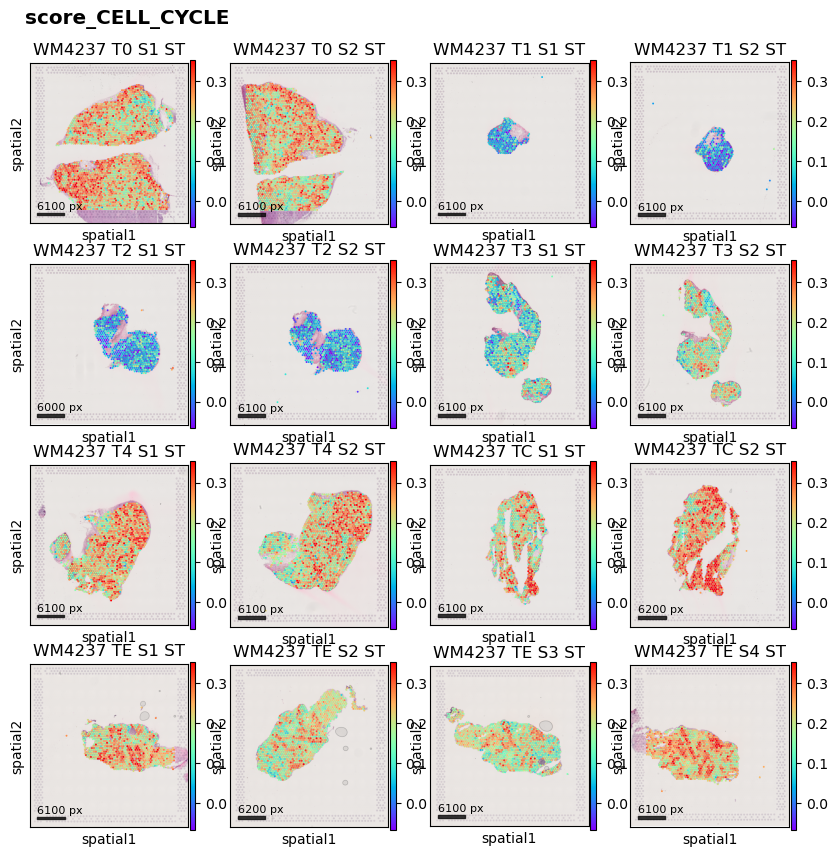

In [32]:
plotSpatialAll(ads, identity='score_CELL_CYCLE', palette=palette_rna, f=0.5)

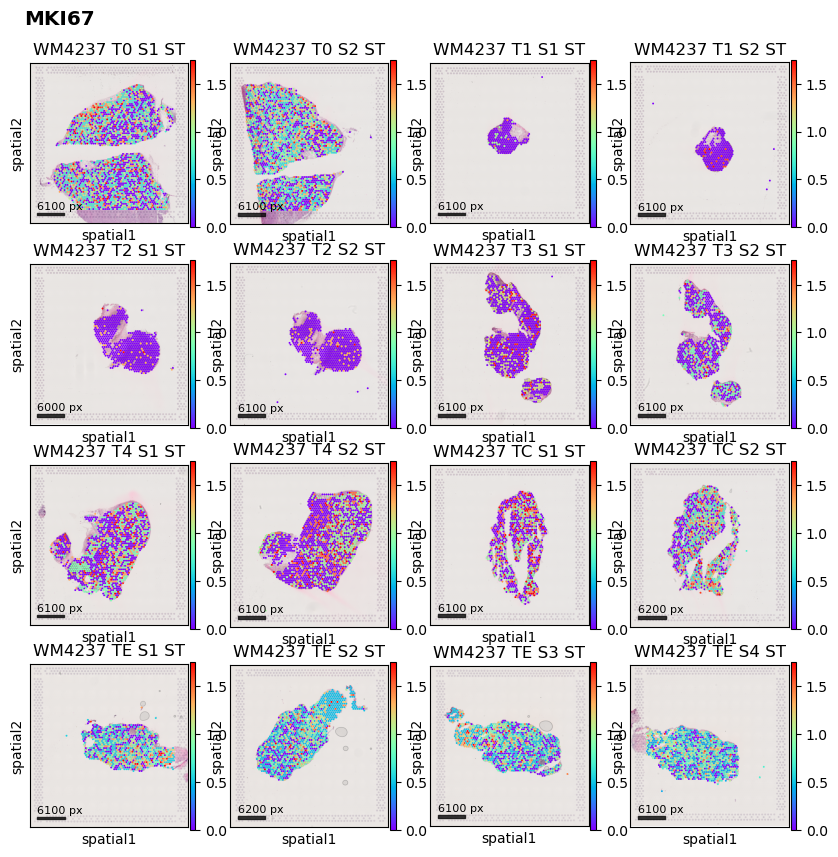

In [33]:
plotSpatialAll(ads, identity='MKI67', palette=palette_rna, f=0.5)

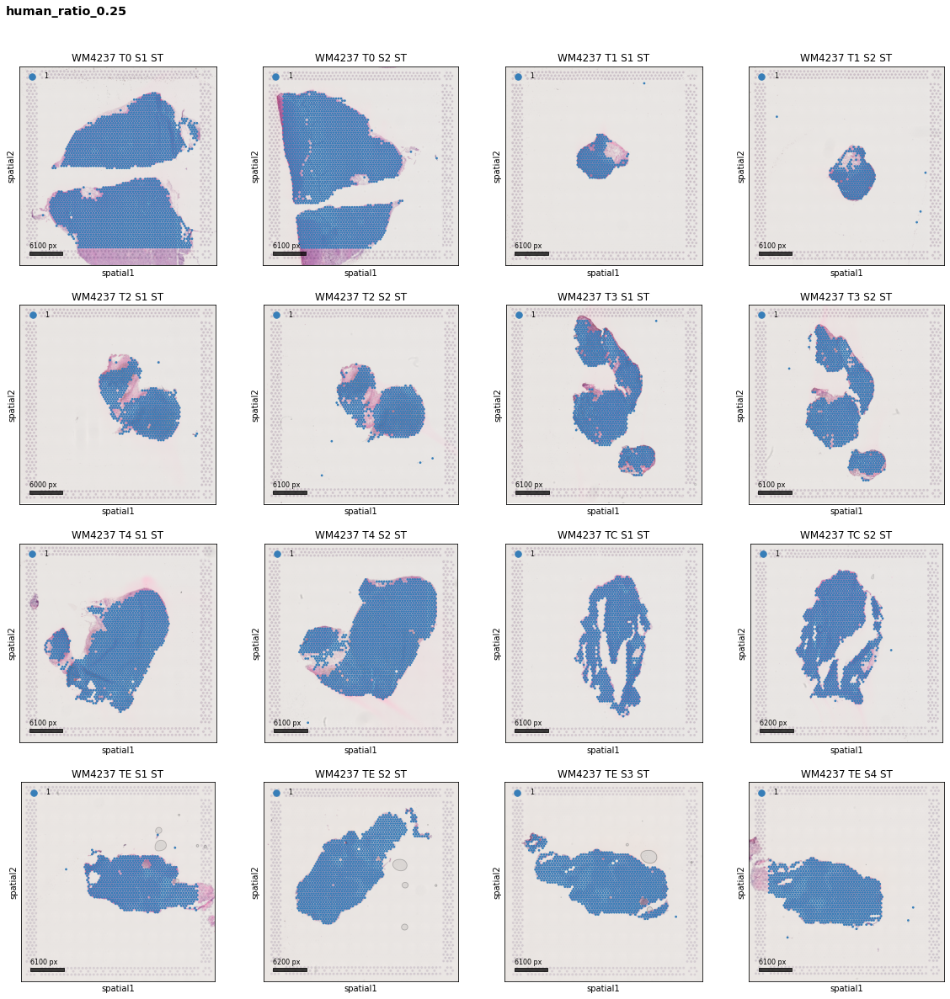

In [10]:
ad_all.obs['human_ratio_0.25'] = (ad_all.obs['human_ratio'] > 0.25).astype(int).astype(str).astype('category')
plotSpatialAll(ads, identity='human_ratio_0.25', palette=palette_rna, f=1.0)

In [4]:
df_infercnv_cnv, df_infercnv_meta = loadCNVfromInferCNV(dataPath + 'For_inferCNV_%s_meta.data.tsv.gz' % model, 
                                                        [preprocessedInferCNVDataPath + 'infercnv.references.txt',
                                                         preprocessedInferCNVDataPath + 'infercnv.observations.txt'])

(8897, 18397) (18397, 3)


In [5]:
ad_all = sc.read(dataPath + 'ad_all_human_clustered_st_%s.h5ad' % model)
print(ad_all.shape)

ad_all = ad_all[ad_all.obs['human_ratio'] > 0.25]

se = pd.Series(index=pd.MultiIndex.from_frame(df_infercnv_meta).droplevel(0), data=(df_infercnv_cnv!=0).mean(axis=0).values)
ad_all.obs['CNV burden per rna clone'] = se.groupby(level=[0]).mean().reindex(ad_all.obs['cluster']).values
ad_all.obs['CNV burden'] = (df_infercnv_cnv!=0).astype(int).mean(axis=0).reindex(ad_all.obs.index).values

se = ad_all.obs.isna().any(axis=0)
ad_all.obs[se[se].index] = ad_all.obs[se[se].index].fillna(0.)

l = 'HOEK_INVASIVE'
score_genes(ad_all, gene_list=ad_all.var.index.intersection(genesDicts[l]), score_name=f'score_{l}', ctrl_size=50)

ads = {id: ad_all[ad_all.obs['sample']==id, :] for id in ids}
images = {id: sc.read(preprocessedStDataPath + '%s/st_adata_processed.h5ad' % id).uns['spatial'] for id in ids}
for sample in ids[:]:
    ads[sample] = ad_all[ad_all.obs['sample']==sample, :].copy()    
    ads[sample].uns['spatial'] = images[sample]

(18406, 18720)


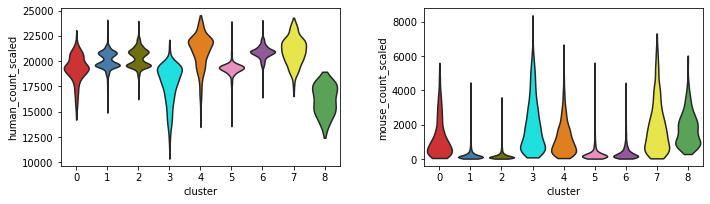

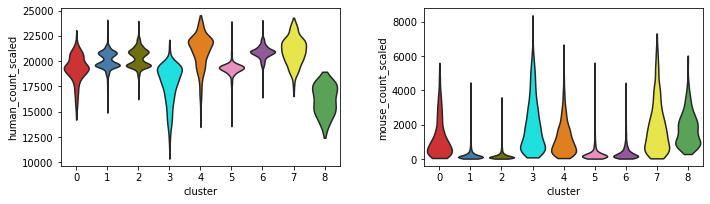

In [6]:
plt.rcParams["figure.figsize"] = (5, 3)
sc.pl.violin(ad_all, keys=['human_count_scaled', 'mouse_count_scaled'], groupby='cluster', stripplot=False, palette=palette_rna)
sc.pl.violin(ad_all[ad_all.obs['human_ratio']>0.50], keys=['human_count_scaled', 'mouse_count_scaled'], groupby='cluster', stripplot=False, palette=palette_rna)

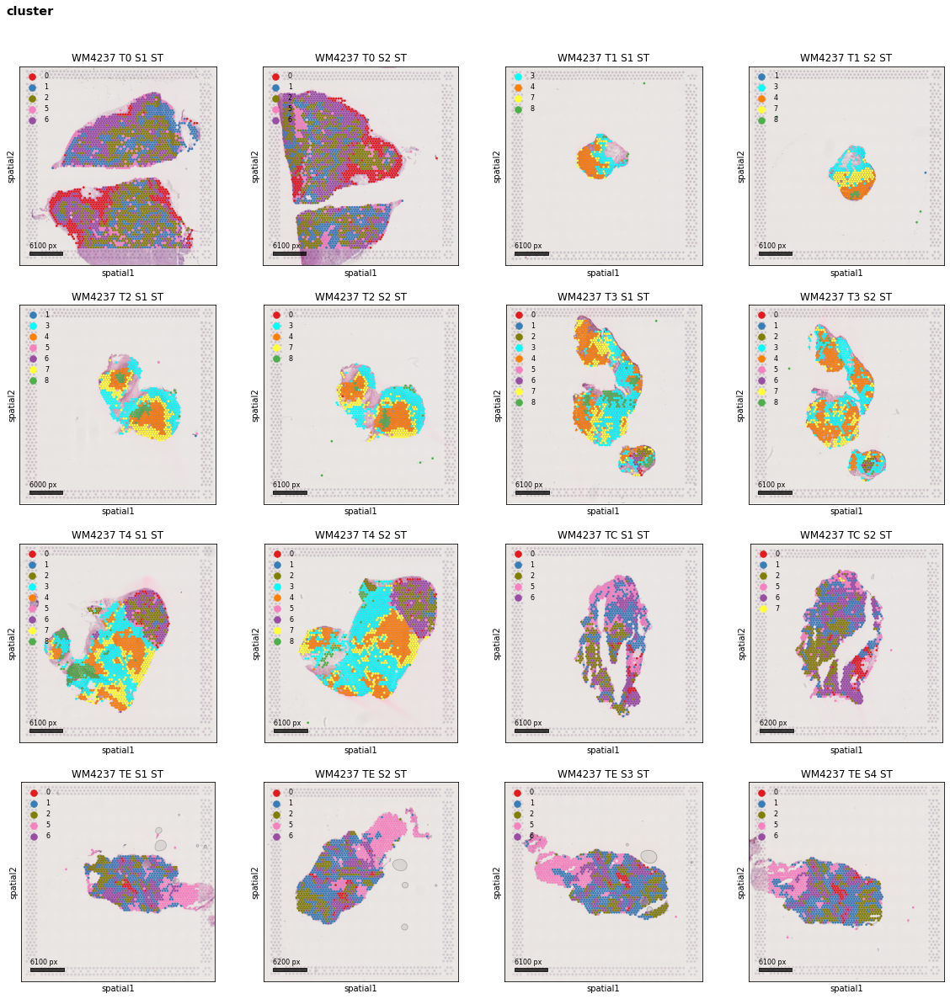

In [7]:
plotSpatialAll(ads, identity='cluster', palette=palette_rna, f=1.0)

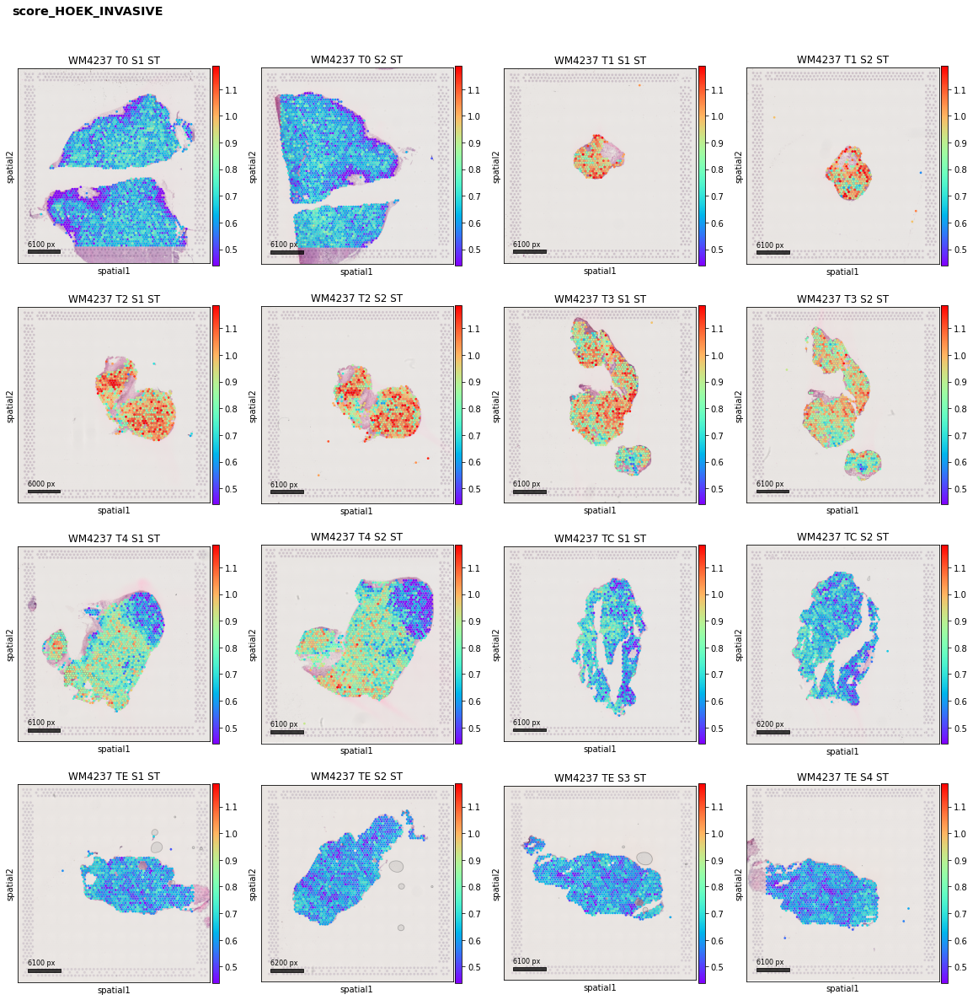

In [8]:
plotSpatialAll(ads, identity='score_HOEK_INVASIVE', palette=palette_rna, f=1.0)

In [9]:
def inferOrdering(ad_sel, referenceGene='CCND1', selGenes=['GAPDH', 'CCND1'], label='label', palette=palette_rna, nCPUs=6, makePlots=False, samples=[], min_spots_harmonize=100):
    
    print(label)
    ad_sel = ad_sel[:, ad_sel.var['is_human_gene'].values]
    sc.pp.highly_variable_genes(ad_sel, flavor="seurat", batch_key='sample', n_top_genes=200)
    sc.pp.pca(ad_sel, n_comps=30, zero_center=True, use_highly_variable=True)
    
    if ad_sel.shape[0] >= 100:
        sce.pp.harmony_integrate(ad_sel, 'sample')
        sc.pp.neighbors(ad_sel, use_rep='X_pca_harmony')
    else:
        sc.pp.neighbors(ad_sel, use_rep='X_pca')
        
    sc.tl.umap(ad_sel)
    print(ad_sel.shape)
    
    scf.tl.curve(ad_sel, Nodes=10, use_rep="X_umap", ndims_rep=2)
    scf.tl.root(ad_sel, referenceGene, tips_only=True) 
    scf.tl.convert_to_soft(ad_sel, 1, 1000)
    ad_sel.uns['epg'] = None
    
    scf.tl.pseudotime(ad_sel, n_jobs=nCPUs, n_map=100, seed=42)
    
    try:
        ad_sel.obs = ad_sel.obs.drop(['human_ratio_0.10', 'human_ratio_0.25', 'human_ratio_0.50', 'human_ratio_0.75'], axis=1)
    except Exception as exception:
        print(exception)
    
    ad_sel.write(dataPath + f'ad_sel_ordered_{label}.h5ad')
    
    if makePlots:
        plt.rcParams["figure.figsize"] = (4,4)
        sc.pl.umap(ad_sel, color=['cluster'] + selGenes, palette=palette)
        
        plt.rcParams["figure.figsize"] = (5,5)
        scf.pl.graph(ad_sel, basis="umap")        
        
        plt.rcParams["figure.figsize"] = (5,5)
        scf.pl.trajectory(ad_sel, basis="umap", arrows=True, arrow_offset=1)
        sc.pl.umap(ad_sel, color=['t'])

        plt.rcParams["figure.figsize"] = (4,4)
        for sample in samples:
            ad = ad_sel[ad_sel.obs['sample']==sample]
            sc.pl.spatial(ad, color=['t'], palette=palette, title=sample, spot_size=450)
            
    return

In [10]:
timepoints = ['T0', 'T1', 'T2', 'T3', 'T4', 'TC']

if True:
    for timepoint in timepoints[:]:
        inferOrdering(ad_all[ad_all.obs['T'].isin([timepoint])].copy(), label=f'{model}_{timepoint}', referenceGene='score_HOEK_INVASIVE', samples=[f'{model}_{timepoint}_{sample}_ST' for sample in ['S1', 'S2']])

WM4237_T0


2023-05-04 14:40:51,065 - harmonypy - INFO - Iteration 1 of 10
2023-05-04 14:40:53,431 - harmonypy - INFO - Iteration 2 of 10
2023-05-04 14:40:56,579 - harmonypy - INFO - Iteration 3 of 10
2023-05-04 14:40:58,486 - harmonypy - INFO - Iteration 4 of 10
2023-05-04 14:41:00,271 - harmonypy - INFO - Iteration 5 of 10
2023-05-04 14:41:02,183 - harmonypy - INFO - Iteration 6 of 10
2023-05-04 14:41:03,508 - harmonypy - INFO - Iteration 7 of 10
2023-05-04 14:41:04,166 - harmonypy - INFO - Iteration 8 of 10
2023-05-04 14:41:04,764 - harmonypy - INFO - Converged after 8 iterations


(4960, 18720)
inferring a principal curve --> parameters used 
    10 principal points, mu = 0.1, lambda = 0.01
    finished (0:00:00) --> added 
    .uns['epg'] dictionnary containing inferred elastic curve generated from elpigraph.
    .obsm['X_R'] hard assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'], coordinates of principal points in representation space.
automatic root selection using score_HOEK_INVASIVE values
node 0 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
Converting R into soft assignment matrix
    finished (0:00:00) --> updated 
    .obsm['X_R'] converted soft assignment of cells to principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.
projecting cells onto the principal graph
    m

2023-05-04 14:47:54,519 - harmonypy - INFO - Iteration 1 of 10
2023-05-04 14:47:54,585 - harmonypy - INFO - Iteration 2 of 10
2023-05-04 14:47:54,656 - harmonypy - INFO - Iteration 3 of 10
2023-05-04 14:47:54,726 - harmonypy - INFO - Iteration 4 of 10
2023-05-04 14:47:54,780 - harmonypy - INFO - Converged after 4 iterations


(480, 18720)
inferring a principal curve --> parameters used 
    10 principal points, mu = 0.1, lambda = 0.01
    finished (0:00:00) --> added 
    .uns['epg'] dictionnary containing inferred elastic curve generated from elpigraph.
    .obsm['X_R'] hard assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'], coordinates of principal points in representation space.
automatic root selection using score_HOEK_INVASIVE values
node 0 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
Converting R into soft assignment matrix
    finished (0:00:00) --> updated 
    .obsm['X_R'] converted soft assignment of cells to principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.
projecting cells onto the principal graph
    ma

2023-05-04 14:48:24,162 - harmonypy - INFO - Iteration 1 of 10
2023-05-04 14:48:24,336 - harmonypy - INFO - Iteration 2 of 10
2023-05-04 14:48:24,519 - harmonypy - INFO - Iteration 3 of 10
2023-05-04 14:48:24,711 - harmonypy - INFO - Iteration 4 of 10
2023-05-04 14:48:24,853 - harmonypy - INFO - Iteration 5 of 10
2023-05-04 14:48:25,033 - harmonypy - INFO - Iteration 6 of 10
2023-05-04 14:48:25,162 - harmonypy - INFO - Iteration 7 of 10
2023-05-04 14:48:25,264 - harmonypy - INFO - Iteration 8 of 10
2023-05-04 14:48:25,347 - harmonypy - INFO - Iteration 9 of 10
2023-05-04 14:48:25,436 - harmonypy - INFO - Iteration 10 of 10
2023-05-04 14:48:25,517 - harmonypy - INFO - Converged after 10 iterations


(1315, 18720)
inferring a principal curve --> parameters used 
    10 principal points, mu = 0.1, lambda = 0.01
    finished (0:00:00) --> added 
    .uns['epg'] dictionnary containing inferred elastic curve generated from elpigraph.
    .obsm['X_R'] hard assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'], coordinates of principal points in representation space.
automatic root selection using score_HOEK_INVASIVE values
node 2 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
Converting R into soft assignment matrix
    finished (0:00:00) --> updated 
    .obsm['X_R'] converted soft assignment of cells to principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.
projecting cells onto the principal graph
    m

2023-05-04 14:49:34,549 - harmonypy - INFO - Iteration 1 of 10
2023-05-04 14:49:34,862 - harmonypy - INFO - Iteration 2 of 10
2023-05-04 14:49:35,176 - harmonypy - INFO - Iteration 3 of 10
2023-05-04 14:49:35,490 - harmonypy - INFO - Iteration 4 of 10
2023-05-04 14:49:35,790 - harmonypy - INFO - Converged after 4 iterations


(1906, 18720)
inferring a principal curve --> parameters used 
    10 principal points, mu = 0.1, lambda = 0.01
    finished (0:00:00) --> added 
    .uns['epg'] dictionnary containing inferred elastic curve generated from elpigraph.
    .obsm['X_R'] hard assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'], coordinates of principal points in representation space.
automatic root selection using score_HOEK_INVASIVE values
node 0 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
Converting R into soft assignment matrix
    finished (0:00:00) --> updated 
    .obsm['X_R'] converted soft assignment of cells to principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.
projecting cells onto the principal graph
    m

2023-05-04 14:51:18,782 - harmonypy - INFO - Iteration 1 of 10
2023-05-04 14:51:19,704 - harmonypy - INFO - Iteration 2 of 10
2023-05-04 14:51:20,641 - harmonypy - INFO - Iteration 3 of 10
2023-05-04 14:51:21,594 - harmonypy - INFO - Iteration 4 of 10
2023-05-04 14:51:22,154 - harmonypy - INFO - Iteration 5 of 10
2023-05-04 14:51:22,530 - harmonypy - INFO - Iteration 6 of 10
2023-05-04 14:51:22,880 - harmonypy - INFO - Converged after 6 iterations


(3253, 18720)
inferring a principal curve --> parameters used 
    10 principal points, mu = 0.1, lambda = 0.01
    finished (0:00:00) --> added 
    .uns['epg'] dictionnary containing inferred elastic curve generated from elpigraph.
    .obsm['X_R'] hard assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'], coordinates of principal points in representation space.
automatic root selection using score_HOEK_INVASIVE values
node 0 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
Converting R into soft assignment matrix
    finished (0:00:00) --> updated 
    .obsm['X_R'] converted soft assignment of cells to principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.
projecting cells onto the principal graph
    m

2023-05-04 14:54:04,632 - harmonypy - INFO - Iteration 1 of 10
2023-05-04 14:54:05,112 - harmonypy - INFO - Iteration 2 of 10
2023-05-04 14:54:05,594 - harmonypy - INFO - Iteration 3 of 10
2023-05-04 14:54:06,063 - harmonypy - INFO - Iteration 4 of 10
2023-05-04 14:54:06,433 - harmonypy - INFO - Converged after 4 iterations


(2169, 18720)
inferring a principal curve --> parameters used 
    10 principal points, mu = 0.1, lambda = 0.01
    finished (0:00:00) --> added 
    .uns['epg'] dictionnary containing inferred elastic curve generated from elpigraph.
    .obsm['X_R'] hard assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'], coordinates of principal points in representation space.
automatic root selection using score_HOEK_INVASIVE values
node 2 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
Converting R into soft assignment matrix
    finished (0:00:00) --> updated 
    .obsm['X_R'] converted soft assignment of cells to principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.
projecting cells onto the principal graph
    m

T0


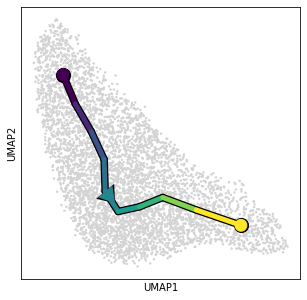

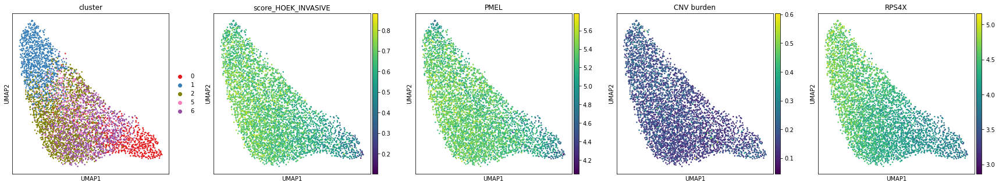

T1


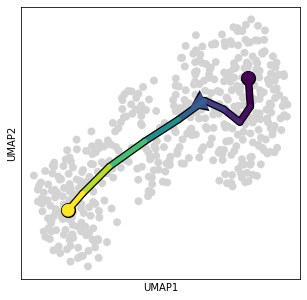

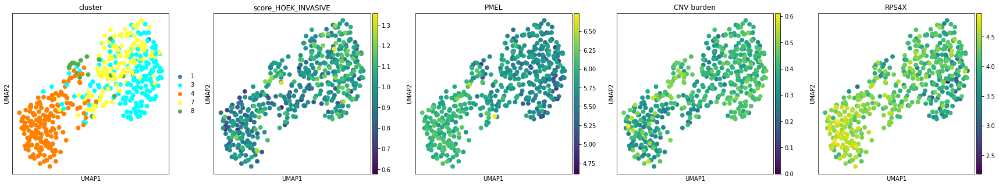

T2


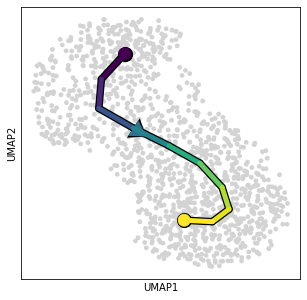

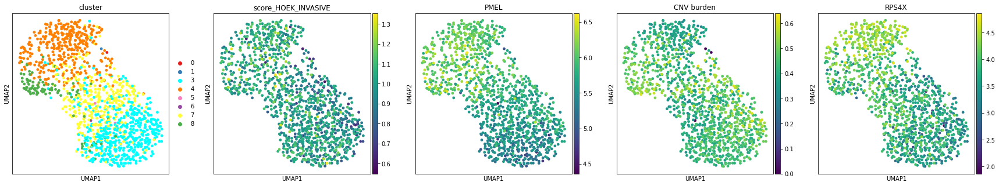

T3


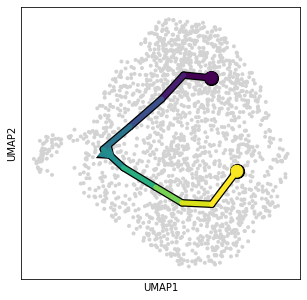

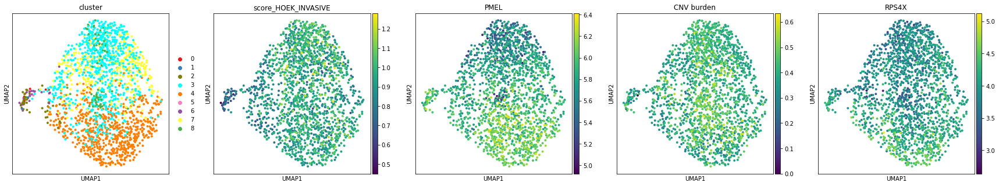

T4


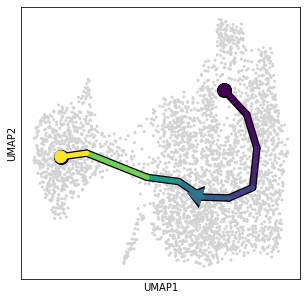

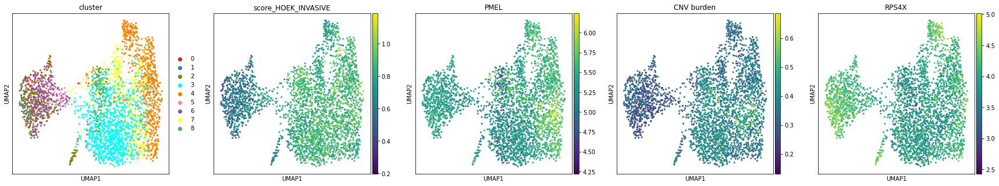

TC


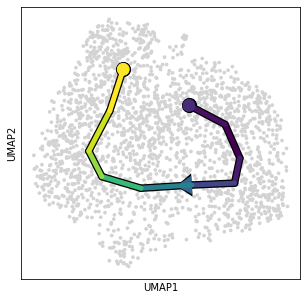

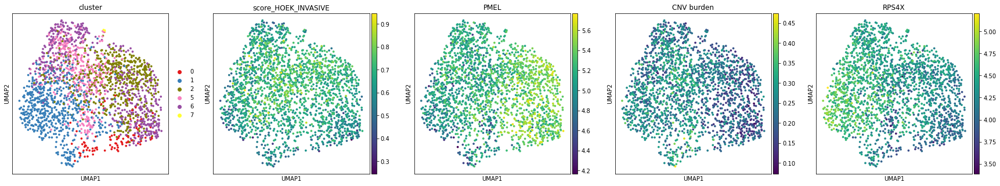

In [11]:
for timepoint in timepoints[:]:
    print(timepoint)
    ad_sel = sc.read(dataPath + f'ad_sel_ordered_{model}_{timepoint}.h5ad')
    plt.rcParams["figure.figsize"] = (4,4)
    #for sample in [f'{model}_{timepoint}_{sample}_ST' for sample in ['S1', 'S2']]:
    #    ad = ad_sel[ad_sel.obs['sample']==sample]
    #    sc.pl.spatial(ad, color=['t', 'CCND1', 'GAPDH'], palette=palette_rna, title=sample, spot_size=450)
    plt.rcParams["figure.figsize"] = (5,5)
    scf.pl.trajectory(ad_sel, basis="umap", arrows=True, arrow_offset=1)
    sc.pl.umap(ad_sel, color=['cluster', 'score_HOEK_INVASIVE', 'PMEL', 'CNV burden', 'RPS4X'], ncols=5, palette=palette_rna)

In [12]:
for timepoint in timepoints[:]:
    ad_sel = sc.read(dataPath + f'ad_sel_ordered_{model}_{timepoint}.h5ad')
    print(timepoint, end='\t')
    
    gene = 'RPS4X'
    print(gene, np.round(pd.concat([ad_sel.obs['score_HOEK_INVASIVE'], ad_sel[:, gene].to_df()[gene]], axis=1).corr().iloc[0][1], 2), end='\t')
    
    gene = 'CCND1'
    print(gene, np.round(pd.concat([ad_sel.obs['score_HOEK_INVASIVE'], ad_sel[:, gene].to_df()[gene]], axis=1).corr().iloc[0][1], 2), end='\t')
    
    gene = 'PMEL'
    print(gene, np.round(pd.concat([ad_sel.obs['score_HOEK_INVASIVE'], ad_sel[:, gene].to_df()[gene]], axis=1).corr().iloc[0][1], 2), end='\t')
    
    gene = 'PMEL'
    print(gene, np.round(pd.concat([ad_sel[:, 'RPS4X'].to_df()['RPS4X'], ad_sel[:, gene].to_df()[gene]], axis=1).corr().iloc[0][1], 2), end='\t')
    
    print()

T0	RPS4X 0.45	CCND1 -0.31	PMEL 0.45	PMEL 0.35	
T1	RPS4X -0.17	CCND1 -0.14	PMEL -0.04	PMEL 0.54	
T2	RPS4X 0.23	CCND1 -0.02	PMEL 0.22	PMEL 0.34	
T3	RPS4X 0.02	CCND1 -0.27	PMEL -0.01	PMEL 0.36	
T4	RPS4X -0.25	CCND1 -0.58	PMEL 0.13	PMEL 0.29	
TC	RPS4X 0.07	CCND1 -0.11	PMEL 0.21	PMEL -0.12	


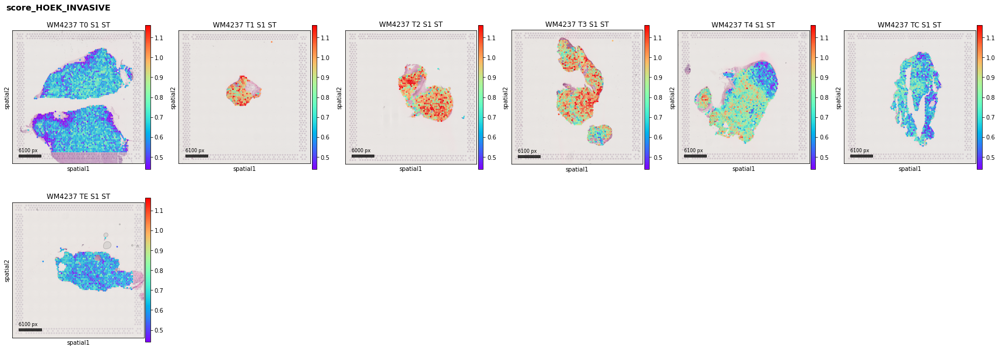

In [13]:
plotSpatialAll({id: ads[id] for id in ids if '_S1_' in id}, identity='score_HOEK_INVASIVE', nx=6, palette=palette_rna, f=1.0)

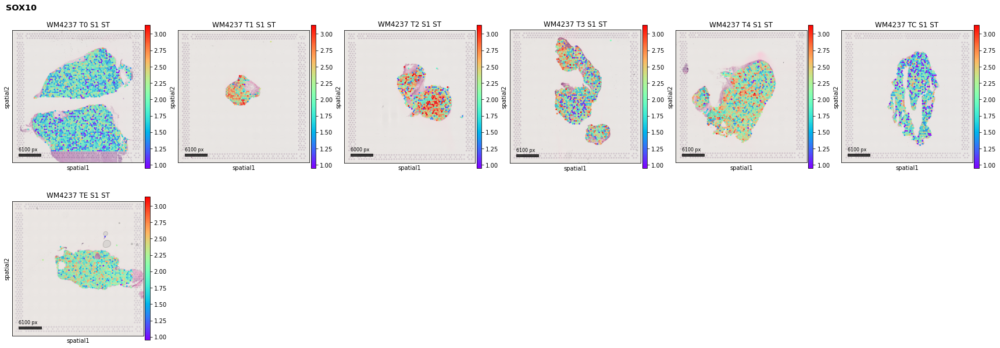

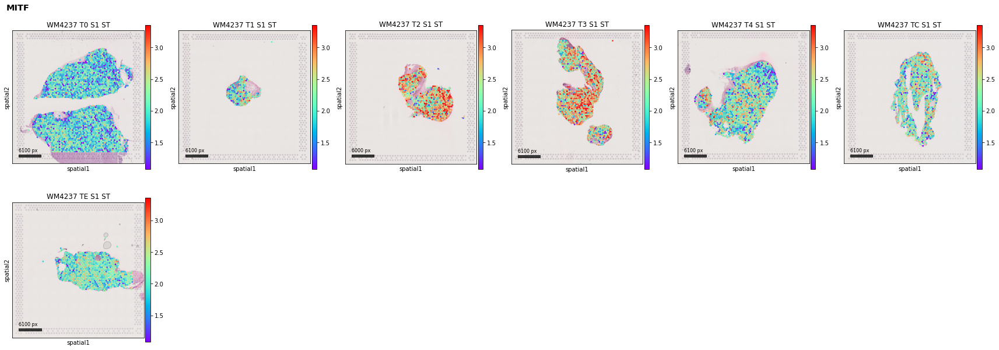

In [14]:
plotSpatialAll({id: ads[id] for id in ids if '_S1_' in id}, identity='SOX10', nx=6, palette=palette_rna, f=1.0)
plotSpatialAll({id: ads[id] for id in ids if '_S1_' in id}, identity='MITF', nx=6, palette=palette_rna, f=1.0)

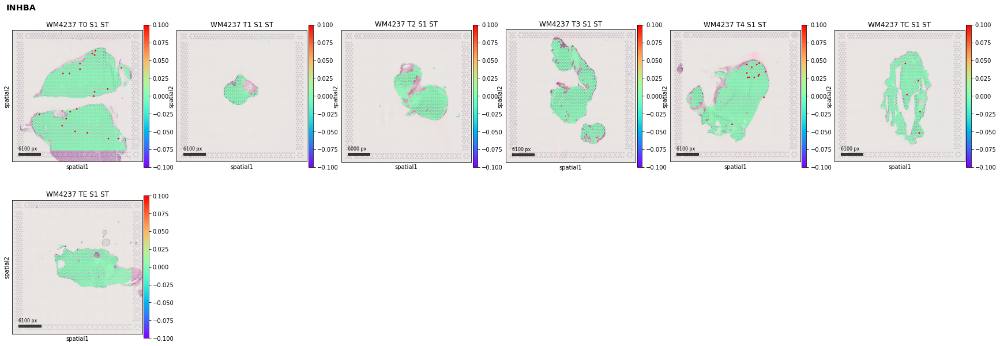

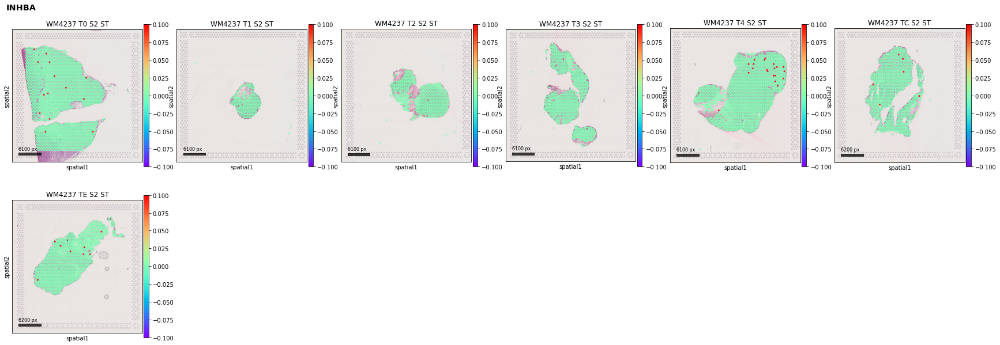

In [15]:
plotSpatialAll({id: ads[id] for id in ids if '_S1_' in id}, identity='INHBA', nx=6, palette=palette_rna, f=1.0)
plotSpatialAll({id: ads[id] for id in ids if '_S2_' in id}, identity='INHBA', nx=6, palette=palette_rna, f=1.0)

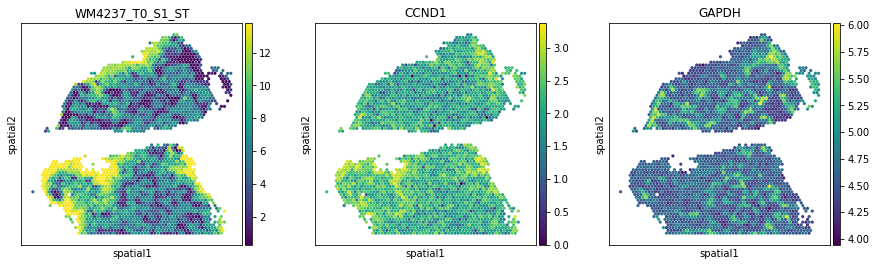

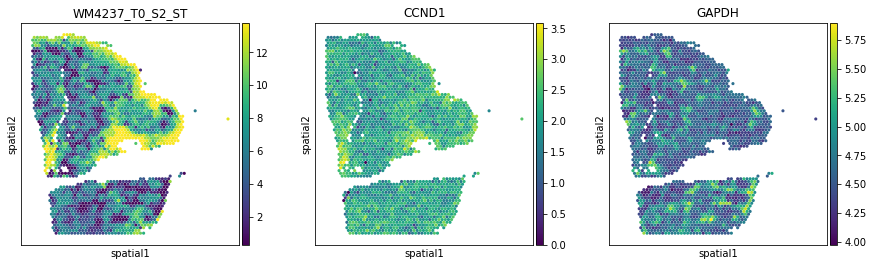

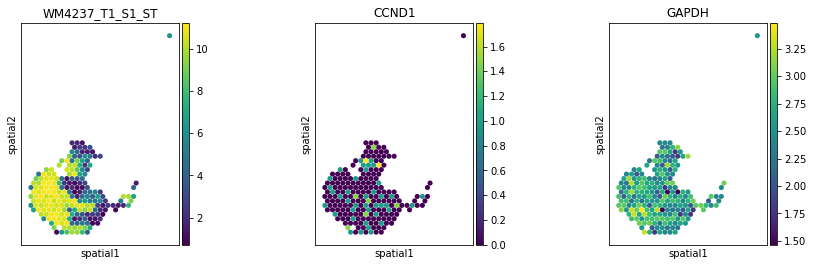

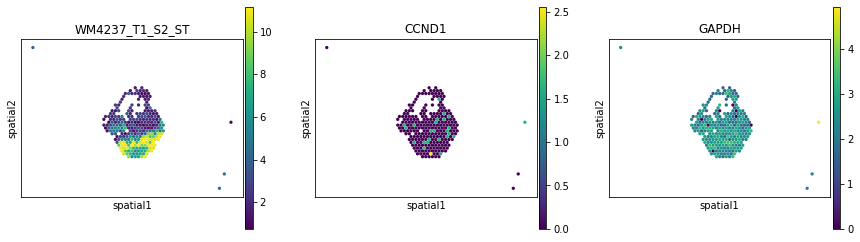

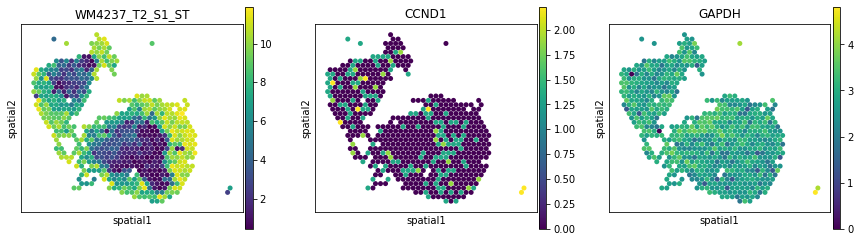

...

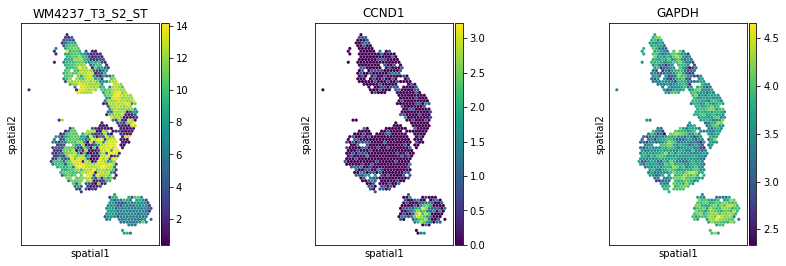

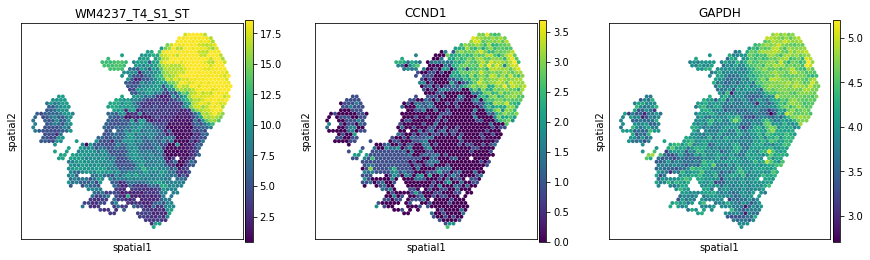

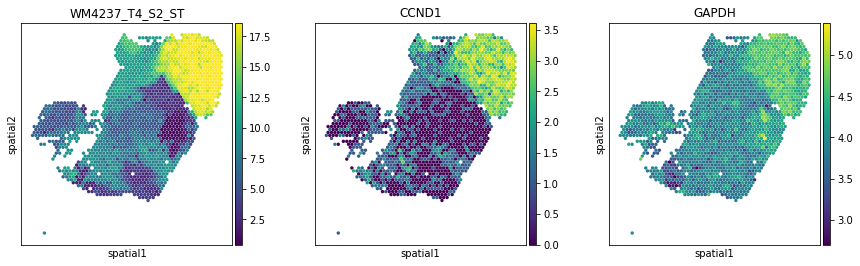

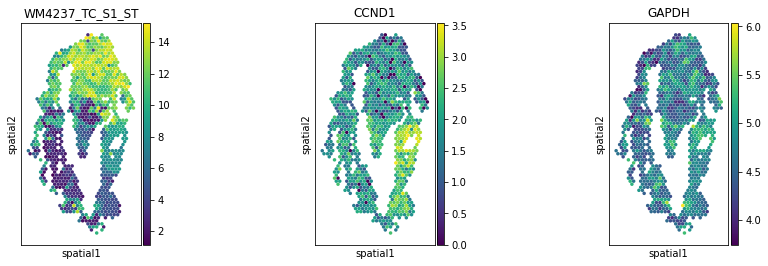

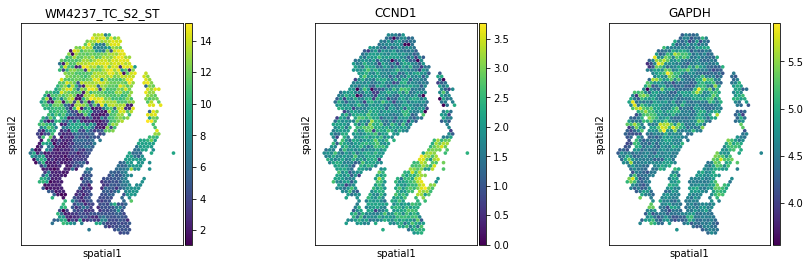

In [16]:
for timepoint in timepoints:
    ad_sel = sc.read(dataPath + f'ad_sel_ordered_{model}_{timepoint}.h5ad')
    plt.rcParams["figure.figsize"] = (4,4)
    for sample in [f'{model}_{timepoint}_{sample}_ST' for sample in ['S1', 'S2']]:
        ad = ad_sel[ad_sel.obs['sample']==sample]
        sc.pl.spatial(ad, color=['t', 'CCND1', 'GAPDH'], palette=palette_rna, title=sample, spot_size=450)

In [5]:
from scipy.interpolate import UnivariateSpline
from scipy.ndimage import gaussian_filter

In [6]:
plt.rcParams['agg.path.chunksize'] = 10000
plt.rcParams['axes.facecolor'] = 'white'

In [19]:
def plotP(l='', d=None, vmax=3.5, f=2.0, gene='CCND1', timepoints=['TC', 'T0', 'T1', 'T2', 'T3', 'T4'], xmin=-0.2, palette=None, xmax=0.5, title_shift=0.075, equal_height=True):
    
    fig, axs = plt.subplots(1, 2*len(timepoints)+1, figsize=(f*8, f*5), gridspec_kw={'width_ratios': [0.35] + [0.75, 1]*len(timepoints)})
    
    for itimepoint, timepoint in enumerate(timepoints[:]):
        ad_sel = sc.read(dataPath + f'ad_sel_ordered_{model}_{timepoint}.h5ad')
        if gene in ad_sel.var.index:
            seC = ad_sel[:, gene].to_df()[gene]
        else:
            seC = ad_sel.obs[f'score_{gene}']
        cmin, cmax = seC.quantile(0.05), seC.quantile(0.95)

        score_genes(ad_sel, gene_list=ad_sel.var.index.intersection(genesDicts[l]), score_name=f'score_{l}', ctrl_size=50)
        if not d is None:
            score_genes(ad_sel, gene_list=ad_sel.var.index.intersection(genesDicts[d]), score_name=f'score_{d}', ctrl_size=50)
            ad_sel.obs[f'score_{l}_over_{d}'] = np.log(ad_sel.obs[f'score_{l}'] / ad_sel.obs[f'score_{d}'])
        
        t = ad_sel.obs['t']
        order = np.argsort(t)[::-1].values
        dfd = pd.get_dummies(ad_sel.obs['cluster'].iloc[order])
        tlow, thigh = t.min(), t.max()
        
        if equal_height:
            tlow, thigh = 0, vmax
        else:
            tlow, thigh = cmin, cmax

        nbins = 20
        ax = axs[itimepoint*2 + 1 + 1]
        for ic, c in enumerate(dfd.columns):
            se = dfd[c]
            xs = np.linspace(tlow, thigh, 300)
            data = np.array([a.sum() for a in np.array_split(se.values, nbins)])
            norm = data.sum()
            if norm > 10:
                data = data / data.sum()
                spline_data = np.vstack((xs, UnivariateSpline(np.linspace(tlow, thigh, nbins), data, k=5, s=0)(xs))).T
                sg = scipy.signal.savgol_filter(spline_data.T[1], 101, 1)
                Y, X = spline_data.T[0], sg
                alpha = 0.75
                ax.fill_betweenx(Y, X, 0, color=palette[c], alpha=alpha, zorder=ic)
                ax.plot(X, Y, c=palette[c], lw=3, alpha=alpha, zorder=ic)
                ax.plot([X[0], 0, 0, X[-1]], [Y[0], Y[0], Y[-1], Y[-1]], color=palette[c], lw=3, alpha=alpha, zorder=ic)

        ax.set_ylim([0, vmax])
        ym = ax.get_xlim()[1]
        ax.set_xlim([0, ym])
        ax.axis('off');

        ax = axs[itimepoint*2 + 0 + 1]
        if True:
            #se = ad_sel[:, 'CCND1'].to_df()['CCND1'].iloc[order]
            #xmin, xmax = 0, vmax

            if d is None:
                se_score = ad_sel.obs[f'score_{l}'].iloc[order]
            else:
                se_score = ad_sel.obs[f'score_{l}_over_{d}'].iloc[order]

            if itimepoint == 0:
                ax.text(xmin, vmax * (1. + title_shift), f'{model}: {l}', fontsize=16)

            Y, X = np.linspace(tlow, thigh, nbins), data
            cc = 'gold'
            ax.plot(se_score.values, np.linspace(tlow, thigh, len(se_score)), 'o', c=cc, lw=3, alpha=alpha, zorder=-1, ms=1, clip_on=False)
            ax.plot([xmin, xmax], [tlow, tlow], ls='-', color='k', lw=1.5, clip_on=False)
            shift = vmax*0.01
            ax.text(xmin, tlow - shift, xmin, ha='center', va='top', fontsize=12)
            if xmin<0:
                ax.plot([0, 0], [tlow, thigh], ls='-', color='k', lw=1.5, clip_on=False)
                ax.text(0, tlow - shift, 0, ha='center', va='top', fontsize=12)
            else:
                ax.plot([xmin, xmin], [tlow, thigh], ls='-', color='k', lw=1.5, clip_on=False)
            ax.text(xmin, vmax*0.025 + Y[-1], timepoint, ha='left', va='bottom', fontsize=16)
            ax.text(xmax, tlow - shift, xmax, ha='center', va='top', fontsize=12)
            ax.set_ylim([0, vmax])
            ax.set_xlim([xmin, xmax])
            
            ax.text(xmin, vmax*0.005, round(cmin, 1), va='bottom', ha='center', fontsize=12)
            ax.text(xmin, vmax, round(cmax, 1), va='top', ha='center', fontsize=12)

        ax.axis('off')
        
    ax = axs[0]
    c2 = 'silver'
    X, Y = [0, 0, 1, 0], [0, 1, 1, 0]
    #X, Y = [0, -1, 0, 0], [0, 1, 1, 0]
    ax.plot(X, Y, c2, zorder=0)
    ax.fill_betweenx(Y, X, 0, color=c2, alpha=1, zorder=0)
    ax.set_ylabel('%s expression' % gene, fontsize=16)
#     ax.set_ylabel('Proliferation (%s expression)' % gene, fontsize=16)
    ax.set_xticks([])
    ax.set_xticklabels([])
    ax.set_yticks([])
    ax.set_yticklabels([])
    ax.spines['bottom'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_ylim(0, 1)
    
    plt.subplots_adjust(wspace=0.25)
    plt.show()
    return

In [20]:
def plotPdot(l='', d=None, vmax=3.5, f=2.0, gene='CCND1', timepoints=['TC', 'T0', 'T1', 'T2', 'T3', 'T4'], xmin=-0.2, palette=None, xmax=0.5, title_shift=0.075, equal_height=True):
    
    fig, axs = plt.subplots(1, len(timepoints)+1, figsize=(f*8, f*5), gridspec_kw={'width_ratios': [0.35] + [1.00]*len(timepoints)})
    
    for itimepoint, timepoint in enumerate(timepoints[:]):
        ad_sel = sc.read(dataPath + f'ad_sel_ordered_{model}_{timepoint}.h5ad')
        if gene in ad_sel.var.index:
            seC = ad_sel[:, gene].to_df()[gene]
        else:
            seC = ad_sel.obs[f'score_{gene}']

        cmin, cmax = seC.quantile(0.05), seC.quantile(0.95)

        score_genes(ad_sel, gene_list=ad_sel.var.index.intersection(genesDicts[l]), score_name=f'score_{l}', ctrl_size=50)
        if not d is None:
            score_genes(ad_sel, gene_list=ad_sel.var.index.intersection(genesDicts[d]), score_name=f'score_{d}', ctrl_size=50)
            ad_sel.obs[f'score_{l}_over_{d}'] = np.log(ad_sel.obs[f'score_{l}'] / ad_sel.obs[f'score_{d}'])
        
        t = ad_sel.obs['t']
        order = np.argsort(t)[::-1].values
        clusters_ordered = ad_sel.obs['cluster'].iloc[order]
        
        tlow, thigh = t.min(), t.max()
        
        if equal_height:
            tlow, thigh = 0, vmax
        else:
            tlow, thigh = cmin, cmax

        nbins = 20
        alpha = 0.75
        
#         ax = axs[itimepoint*2 + 1 + 1]
#         dfd = pd.get_dummies(clusters_ordered)
#         for ic, c in enumerate(dfd.columns):
#             se = dfd[c]
#             xs = np.linspace(tlow, thigh, 300)
#             data = np.array([a.sum() for a in np.array_split(se.values, nbins)])
#             norm = data.sum()
#             if norm > 10:
#                 data = data / data.sum()
#                 spline_data = np.vstack((xs, UnivariateSpline(np.linspace(tlow, thigh, nbins), data, k=5, s=0)(xs))).T
#                 sg = scipy.signal.savgol_filter(spline_data.T[1], 101, 1)
#                 Y, X = spline_data.T[0], sg
#                 ax.fill_betweenx(Y, X, 0, color=palette[c], alpha=alpha, zorder=ic)
#                 ax.plot(X, Y, c=palette[c], lw=3, alpha=alpha, zorder=ic)
#                 ax.plot([X[0], 0, 0, X[-1]], [Y[0], Y[0], Y[-1], Y[-1]], color=palette[c], lw=3, alpha=alpha, zorder=ic)
#
#         ax.set_ylim([0, vmax])
#         ym = ax.get_xlim()[1]
#         ax.set_xlim([0, ym])
#         ax.axis('off');

        ax = axs[itimepoint + 1]
        if True:
            #se, xmin, xmax = ad_sel[:, 'CCND1'].to_df()['CCND1'].iloc[order], 0, vmax
            
            #print(timepoint, clusters_ordered)            
            if d is None:
                se_score = ad_sel.obs[f'score_{l}'].iloc[order]
            else:
                se_score = ad_sel.obs[f'score_{l}_over_{d}'].iloc[order]

            if itimepoint == 0:
                ax.text(xmin, vmax * (1. + title_shift), f'{model}: {l}', fontsize=16)

            uclusters = sorted(clusters_ordered.unique())
            #print(timepoint, uclusters)
            
            for cluster in uclusters:
                wh = np.where(clusters_ordered==cluster)[0]
                X, Y = se_score.values[wh], np.linspace(tlow, thigh, len(se_score))[wh]
                
                ax.plot(X, Y, 'o', c=palette[cluster], alpha=alpha, zorder=-1, ms=3, clip_on=False)
            
            #cc = 'gold'
            #ax.plot(se_score.values, np.linspace(tlow, thigh, len(se_score)), 'o', c=cc, lw=3, alpha=alpha, zorder=-1, ms=1, clip_on=False)
            
            
            ax.plot([xmin, xmax], [tlow, tlow], ls='-', color='k', lw=1.5, clip_on=False)
            shift = vmax*0.01
            ax.text(xmin, tlow - shift, xmin, ha='center', va='top', fontsize=12)
            if xmin<0:
                ax.plot([0, 0], [tlow, thigh], ls='-', color='k', lw=1.5, clip_on=False)
                ax.text(0, tlow - shift, 0, ha='center', va='top', fontsize=12)
            else:
                ax.plot([xmin, xmin], [tlow, thigh], ls='-', color='k', lw=1.5, clip_on=False)
            ax.text(xmin, vmax*0.025 + thigh, timepoint, ha='left', va='bottom', fontsize=16)
            ax.text(xmax, tlow - shift, xmax, ha='center', va='top', fontsize=12)
            ax.set_ylim([0, vmax])
            ax.set_xlim([xmin, xmax])
            
            ax.text(xmin - 0.02 * (xmax - xmin), vmax*0.005, round(cmin, 1), va='bottom', ha='right', fontsize=12)
            ax.text(xmin - 0.02 * (xmax - xmin), vmax, round(cmax, 1), va='top', ha='right', fontsize=12)

        ax.axis('off')
        
    ax = axs[0]
    c2 = 'silver'
    X, Y = [0, 0, 1, 0], [0, 1, 1, 0]
    #X, Y = [0, -1, 0, 0], [0, 1, 1, 0]
    ax.plot(X, Y, c2, zorder=0)
    ax.fill_betweenx(Y, X, 0, color=c2, alpha=1, zorder=0)
    ax.set_ylabel('%s expression' % gene, fontsize=16)
#     ax.set_ylabel('Proliferation (%s expression)' % gene, fontsize=16)
    ax.set_xticks([])
    ax.set_xticklabels([])
    ax.set_yticks([])
    ax.set_yticklabels([])
    ax.spines['bottom'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_ylim(0, 1)
    
    plt.subplots_adjust(wspace=0.25)
    plt.show()
    return

# plotPdot(l='WP_GLYCOLYSIS_AND_GLUCONEOGENESIS', vmax=4.0, xmin=0, xmax=1.2, palette=palette_rna)

<AxesSubplot:>

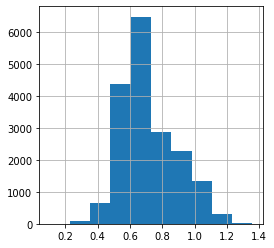

In [21]:
ad_all.obs['score_HOEK_INVASIVE'].hist()

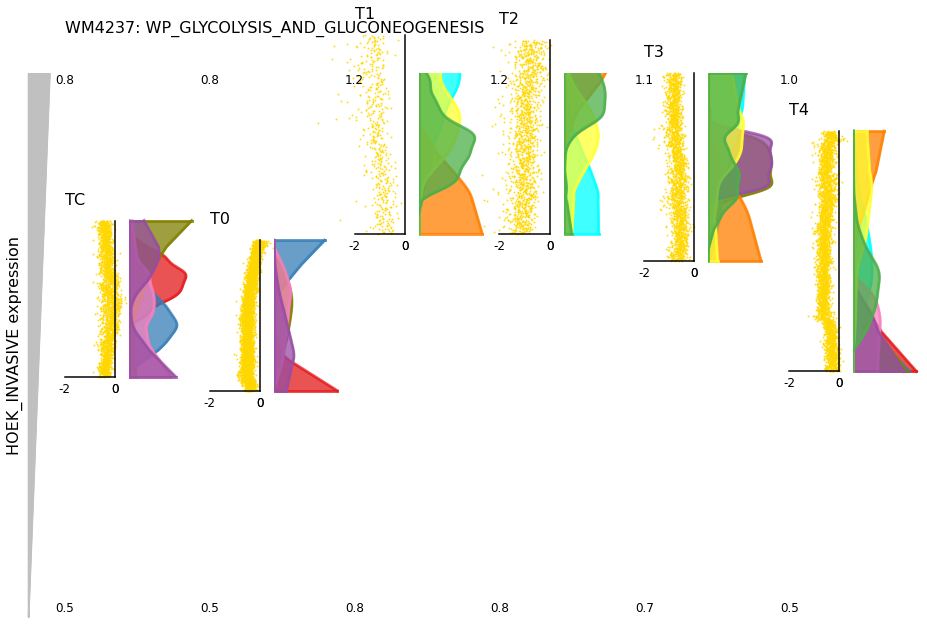

In [22]:
# plotP(l='PID_HIF1_TFPATHWAY', vmax=4.0, xmin=-0.2, xmax=0.6, equal_height=True, palette=palette_rna)
plotP(l='WP_GLYCOLYSIS_AND_GLUCONEOGENESIS', d='OXPHOS', gene='HOEK_INVASIVE', vmax=1.1, xmin=-2, xmax=0, equal_height=False, palette=palette_rna)

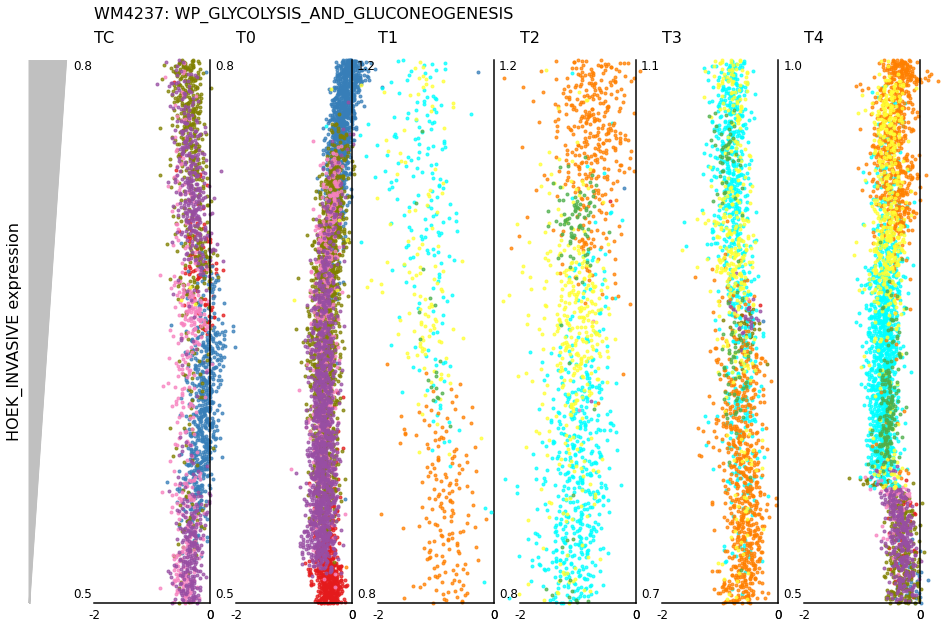

In [23]:
# plotPdot(l='HOEK_INVASIVE', gene='HOEK_INVASIVE', vmax=1.0, xmin=0, xmax=1, equal_height=True, palette=palette_rna)
plotPdot(l='WP_GLYCOLYSIS_AND_GLUCONEOGENESIS', d='OXPHOS', gene='HOEK_INVASIVE', vmax=1.1, xmin=-2, xmax=0, equal_height=True, palette=palette_rna)
# plotPdot(l='HOEK_INVASIVE', d='OXPHOS', vmax=4.0, xmin=-1, xmax=2, equal_height=True, palette=palette_rna)
# plotPdot(l='WP_GLYCOLYSIS_AND_GLUCONEOGENESIS', d='OXPHOS', vmax=4.0, xmin=-1, xmax=2, palette=palette_rna)

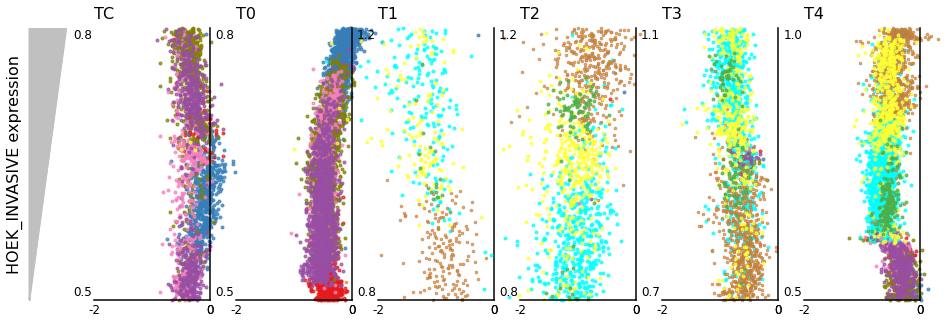

In [24]:
def plotPdotInv(l='', d=None, vmax=3.5, figsize=(16, 10), gene='CCND1', timepoints=['TC', 'T0', 'T1', 'T2', 'T3', 'T4'], xmin=-0.2, palette=None, xmax=0.5, title_shift=0.075, equal_height=True):
    
    fig, axs = plt.subplots(1, len(timepoints)+1, figsize=figsize, gridspec_kw={'width_ratios': [0.35] + [1.00]*len(timepoints)})
    
    for itimepoint, timepoint in enumerate(timepoints[:]):
        ad_sel = sc.read(dataPath + f'ad_sel_ordered_{model}_{timepoint}.h5ad')
        if gene in ad_sel.var.index:
            seC = ad_sel[:, gene].to_df()[gene]
        else:
            seC = ad_sel.obs[f'score_{gene}']

        cmin, cmax = seC.quantile(0.05), seC.quantile(0.95)

        score_genes(ad_sel, gene_list=ad_sel.var.index.intersection(genesDicts[l]), score_name=f'score_{l}', ctrl_size=50)
        if not d is None:
            score_genes(ad_sel, gene_list=ad_sel.var.index.intersection(genesDicts[d]), score_name=f'score_{d}', ctrl_size=50)
            ad_sel.obs[f'score_{l}_over_{d}'] = np.log(ad_sel.obs[f'score_{l}'] / ad_sel.obs[f'score_{d}'])
        
        t = ad_sel.obs['t']
        order = np.argsort(t)[::-1].values
        clusters_ordered = ad_sel.obs['cluster'].iloc[order]
        
        tlow, thigh = t.min(), t.max()
        
        if equal_height:
            tlow, thigh = 0, vmax
        else:
            tlow, thigh = cmin, cmax

        nbins = 20
        alpha = 0.75
        
        ax = axs[itimepoint + 1]
        if True:
            if d is None:
                se_score = ad_sel.obs[f'score_{l}'].iloc[order]
            else:
                se_score = ad_sel.obs[f'score_{l}_over_{d}'].iloc[order]

#             if itimepoint == 0:
#                 ax.text(xmin, vmax * (1. + title_shift), f'{model}: {l}', fontsize=16)

            uclusters = sorted(clusters_ordered.unique())
            
            for cluster in uclusters:
                wh = np.where(clusters_ordered==cluster)[0]
                X, Y = se_score.values[wh], np.linspace(tlow, thigh, len(se_score))[wh]
                mec = 'grey' if cluster=='4' else None
                mew = 0.5 if cluster=='4' else None
                ax.plot(X, Y, 'o', c=palette[cluster], alpha=alpha, zorder=-1, ms=3, mec=mec, mew=mew, clip_on=False)
            
            ax.plot([xmin, xmax], [tlow, tlow], ls='-', color='k', lw=1.5, clip_on=False)
            shift = vmax*0.01
            ax.text(xmin, tlow - shift, xmin, ha='center', va='top', fontsize=12)
            if xmin<0:
                ax.plot([0, 0], [tlow, thigh], ls='-', color='k', lw=1.5, clip_on=False)
                ax.text(0, tlow - shift, 0, ha='center', va='top', fontsize=12)
            else:
                ax.plot([xmin, xmin], [tlow, thigh], ls='-', color='k', lw=1.5, clip_on=False)
            ax.text(xmin, vmax*0.025 + thigh, timepoint, ha='left', va='bottom', fontsize=16)
            ax.text(xmax, tlow - shift, xmax, ha='center', va='top', fontsize=12)
            ax.set_ylim([0, vmax])
            ax.set_xlim([xmin, xmax])
            
            ax.text(xmin - 0.02 * (xmax - xmin), vmax*0.005, round(cmin, 1), va='bottom', ha='right', fontsize=12)
            ax.text(xmin - 0.02 * (xmax - xmin), vmax, round(cmax, 1), va='top', ha='right', fontsize=12)

        ax.axis('off')
        
    ax = axs[0]
    c2 = 'silver'
    X, Y = [0, 0, 1, 0], [0, 1, 1, 0]
    #X, Y = [0, -1, 0, 0], [0, 1, 1, 0]
    ax.plot(X, Y, c2, zorder=0)
    ax.fill_betweenx(Y, X, 0, color=c2, alpha=1, zorder=0)
    ax.set_ylabel('%s expression' % gene, fontsize=16)
    ax.set_xticks([])
    ax.set_xticklabels([])
    ax.set_yticks([])
    ax.set_yticklabels([])
    ax.spines['bottom'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_ylim(0, 1)
    
    plt.subplots_adjust(wspace=0.25)
    plt.show()
    return

plotPdotInv(l='WP_GLYCOLYSIS_AND_GLUCONEOGENESIS', d='OXPHOS', gene='HOEK_INVASIVE', figsize=(16, 5), vmax=1.1, xmin=-2, xmax=0, equal_height=True, palette=palette_rna)

In [3]:
timepoints = ['T0', 'T1', 'T2', 'T3', 'T4', 'TC']

ads_sel = {timepoint: sc.read(dataPath + f'ad_sel_ordered_{model}_{timepoint}.h5ad') for timepoint in timepoints}

In [26]:
def plotPdotInv(l='', d=None, vmax=3.5, figsize=(16, 10), gene='CCND1', ads_sel=None, timepoints=['TC', 'T0', 'T1', 'T2', 'T3', 'T4'], xmin=-0.2, ms=3., palette=None, xmax=0.5, title_shift=0.075, equal_height=True):
    
    fig, axs = plt.subplots(1, len(timepoints), figsize=figsize, gridspec_kw={'width_ratios': [1.00]*len(timepoints)})
#     fig, axs = plt.subplots(1, len(timepoints)+1, figsize=figsize, gridspec_kw={'width_ratios': [0.35] + [1.00]*len(timepoints)})
    
    for itimepoint, timepoint in enumerate(timepoints[:]):
        if ads_sel is None:
            ad_sel = sc.read(dataPath + f'ad_sel_ordered_{model}_{timepoint}.h5ad')
        else:
            ad_sel = ads_sel[timepoint]
        if gene in ad_sel.var.index:
            seC = ad_sel[:, gene].to_df()[gene]
        else:
            seC = ad_sel.obs[f'score_{gene}']

        cmin, cmax = seC.quantile(0.05), seC.quantile(0.95)

        score_genes(ad_sel, gene_list=ad_sel.var.index.intersection(genesDicts[l]), score_name=f'score_{l}', ctrl_size=50)
        if not d is None:
            score_genes(ad_sel, gene_list=ad_sel.var.index.intersection(genesDicts[d]), score_name=f'score_{d}', ctrl_size=50)
            ad_sel.obs[f'score_{l}_over_{d}'] = np.log(ad_sel.obs[f'score_{l}'] / ad_sel.obs[f'score_{d}'])
        
        t = ad_sel.obs['t']
        order = np.argsort(t)[::-1].values
        clusters_ordered = ad_sel.obs['cluster'].iloc[order]
        
        tlow, thigh = t.min(), t.max()
        
        if equal_height:
            tlow, thigh = 0, vmax
        else:
            tlow, thigh = cmin, cmax

        nbins = 20
        alpha = 0.75
        
        ax = axs[itimepoint]
        if True:
            if d is None:
                se_score = ad_sel.obs[f'score_{l}'].iloc[order]
            else:
                se_score = ad_sel.obs[f'score_{l}_over_{d}'].iloc[order]

            if itimepoint == 0:
                txt = f'{l}'.replace('_', ' ').replace(' ', '\n')
                #ax.text(tlow, xmax - 0.5 * (xmax - xmin), txt, fontsize=10, ha='right', va='center', rotation=90)
                ax.st

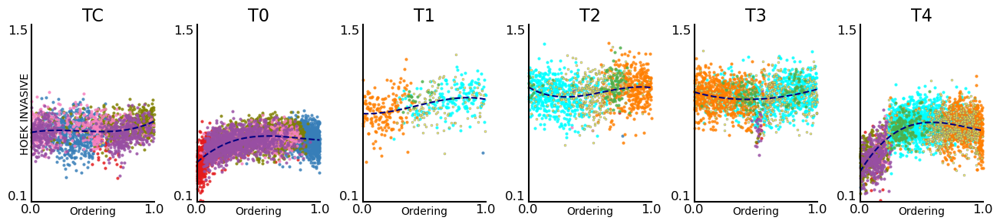

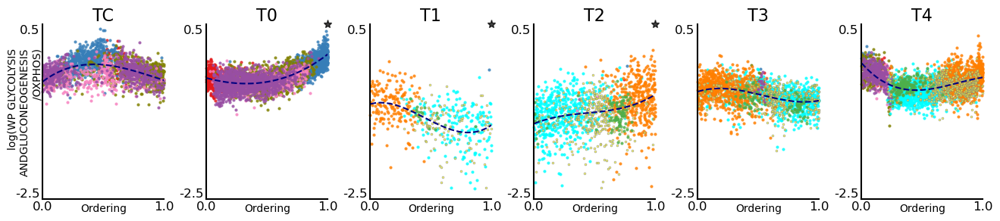

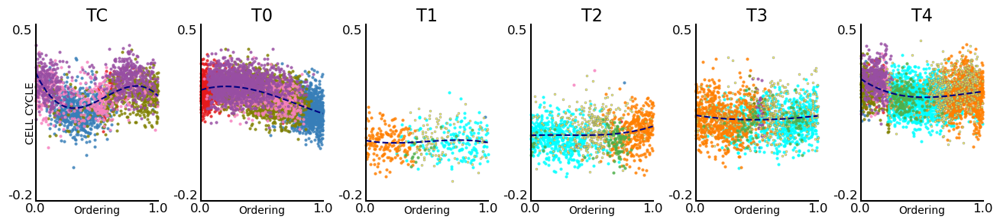

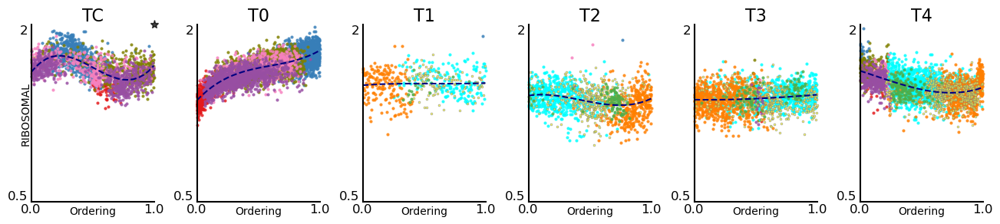

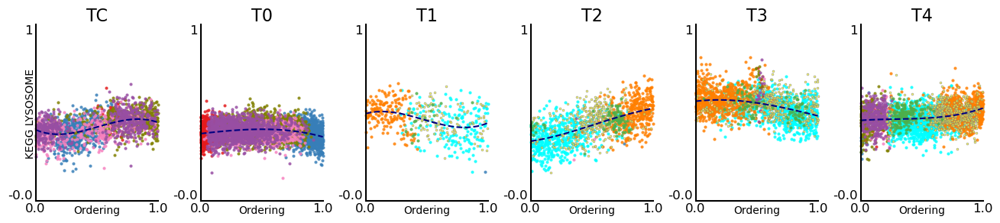

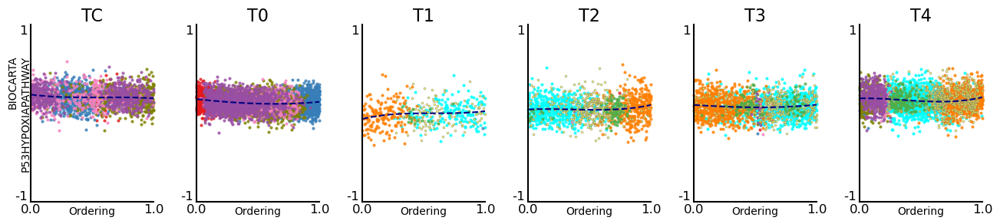

In [22]:
def plotPdotInv(l='', d=None, vmax=3.5, figsize=(16, 10), gene='CCND1', ads_sel=None, timepoints=['TC', 'T0', 'T1', 'T2', 'T3', 'T4'], xmin=-0.2, ms=3., palette=None, xmax=0.5, title_shift=0.075, equal_height=True):
    
    def splitTextToRows(txt, maxl=20):
    
        txt = txt.replace('_', ' ').split(' ')
        maxl = max(max([len(t) for t in txt]), maxl)

        chunks = []
        temp_chunk = ''
        for t in txt:
            if len(temp_chunk + t) + 1 < maxl:
                temp_chunk += t + ' '
            else:
                chunks.append(temp_chunk.strip(' '))
                temp_chunk = t
        chunks.append(temp_chunk.strip(' '))

        return '\n'.join(chunks)

    fig, axs = plt.subplots(1, len(timepoints), figsize=figsize, gridspec_kw={'width_ratios': [1.00]*len(timepoints)})
    
    for itimepoint, timepoint in enumerate(timepoints[:]):
        if ads_sel is None:
            ad_sel = sc.read(dataPath + f'ad_sel_ordered_{model}_{timepoint}.h5ad')
        else:
            ad_sel = ads_sel[timepoint]
        if gene in ad_sel.var.index:
            seC = ad_sel[:, gene].to_df()[gene]
        else:
            seC = ad_sel.obs[f'score_{gene}']

        cmin, cmax = seC.quantile(0.05), seC.quantile(0.95)

        score_genes(ad_sel, gene_list=ad_sel.var.index.intersection(genesDicts[l]), score_name=f'score_{l}', ctrl_size=50)
        if not d is None:
            score_genes(ad_sel, gene_list=ad_sel.var.index.intersection(genesDicts[d]), score_name=f'score_{d}', ctrl_size=50)
            ad_sel.obs[f'score_{l}_over_{d}'] = np.log(ad_sel.obs[f'score_{l}'] / ad_sel.obs[f'score_{d}'])
        
        t = ad_sel.obs['t']
        order = np.argsort(t)[::-1].values
        clusters_ordered = ad_sel.obs['cluster'].iloc[order]
        
        tlow, thigh = t.min(), t.max()
        
        if equal_height:
            tlow, thigh = 0, vmax
        else:
            tlow, thigh = cmin, cmax

        nbins = 20
        alpha = 0.75
        
        ax = axs[itimepoint]
        if True:
            if d is None:
                se_score = ad_sel.obs[f'score_{l}'].iloc[order]
            else:
                se_score = ad_sel.obs[f'score_{l}_over_{d}'].iloc[order]

            if itimepoint == 0:
                #txt = f'{l}'.replace('_', ' ').replace(' ', '\n')
                if not d is None:
                    txt = splitTextToRows(f'log({l} / {d})')
                else:
                    txt = splitTextToRows(f'{l}')
                
                ax.text(tlow, xmax - 0.5 * (xmax - xmin), txt, fontsize=10, ha='right', va='center', rotation=90)
                #ax.set_ylabel(txt, fontsize=10)
                

            uclusters = sorted(clusters_ordered.unique())
            
            star = False
            for cluster in uclusters:
                cond = clusters_ordered==cluster
                cond_out = (se_score.values < xmin) | (se_score.values > xmax)
                if cond_out.sum()>0:
                    #print(timepoint, cond_out.sum(), 'clipped')
                    star = True
                wh = np.where(cond & ~cond_out)[0]
                X, Y = se_score.values[wh], np.linspace(tlow, thigh, len(se_score))[wh]
                mec = 'grey' if cluster=='7' else None
                mew = 0.5 if cluster=='7' else None
                ax.plot(Y, X, 'o', c=palette[cluster], alpha=alpha, zorder=-1, ms=ms, mec=mec, mew=mew, clip_on=False)
                
            X, Y = se_score.values, np.linspace(tlow, thigh, len(se_score))
            X[X!=X] = 0.
            ax.plot(*np.polynomial.Polynomial.fit(Y, X, 3).linspace(25), '--', color='navy')
            
            if star:
                ax.plot([vmax], [xmax], '*', c='black', alpha=alpha, zorder=-1, ms=8, clip_on=False)
            
            ax.plot([tlow, tlow], [xmin, xmax], ls='-', color='k', lw=1.5, clip_on=False)
            ax.plot([tlow, thigh], [xmin, xmin], ls='-', color='k', lw=1.5, clip_on=False)
            
            xshift = (thigh - tlow)*0.025
            yshift = (xmax - xmin)*0.01
            
            ax.text(tlow + 0.5 * (thigh - tlow), xmin - 2 * yshift, 'Ordering', fontsize=10, ha='center', va='top', rotation=0)
            
            ax.text(tlow - xshift, xmin, xmin, ha='right', va='bottom', fontsize=12)
            ax.text(tlow, xmin - yshift, 0., ha='center', va='top', fontsize=12)
            ax.text(thigh, xmin - yshift, thigh, ha='center', va='top', fontsize=12)
            ax.text(0.5 * (tlow + thigh), xmax, timepoint, ha='center', va='bottom', fontsize=16)
            ax.text(tlow - xshift, xmax, xmax, ha='right', va='top', fontsize=12)
            ax.set_xlim([0, thigh])
            ax.set_ylim([xmin, xmax])
            
        ax.axis('off')
    
    plt.subplots_adjust(wspace=0.35)
    plt.show()
    return

plotPdotInv(l='HOEK_INVASIVE', gene='HOEK_INVASIVE', figsize=(16, 3), vmax=1.0, xmin=0.1, xmax=1.5, ms=2., equal_height=True, palette=palette_rna, ads_sel=ads_sel)
plotPdotInv(l='WP_GLYCOLYSIS_AND_GLUCONEOGENESIS', d='OXPHOS', gene='HOEK_INVASIVE', figsize=(16, 3), vmax=1.0, xmin=-2.5, xmax=0.5, ms=2., equal_height=True, palette=palette_rna, ads_sel=ads_sel)
plotPdotInv(l='CELL_CYCLE', gene='HOEK_INVASIVE', figsize=(16, 3), vmax=1.0, xmin=-0.2, xmax=0.5, ms=2., equal_height=True, palette=palette_rna, ads_sel=ads_sel)
plotPdotInv(l='RIBOSOMAL', gene='HOEK_INVASIVE', figsize=(16, 3), vmax=1.0, xmin=0.5, xmax=2, ms=2., equal_height=True, palette=palette_rna, ads_sel=ads_sel)

plotPdotInv(l='KEGG_LYSOSOME', gene='HOEK_INVASIVE', figsize=(16, 3), vmax=1.0, xmin=-0., xmax=1, ms=2., equal_height=True, palette=palette_rna, ads_sel=ads_sel)
plotPdotInv(l='BIOCARTA_P53HYPOXIA_PATHWAY', gene='HOEK_INVASIVE', figsize=(16, 3), vmax=1.0, xmin=-1, xmax=1, ms=2., equal_height=True, palette=palette_rna, ads_sel=ads_sel)

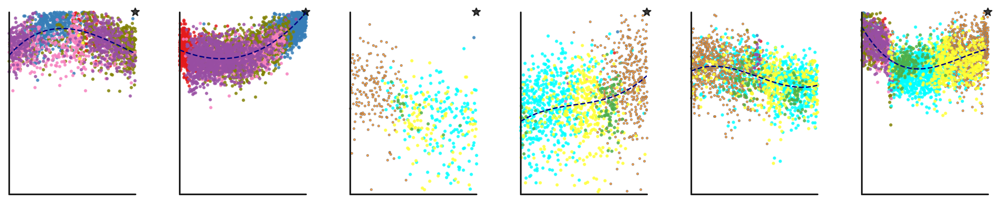

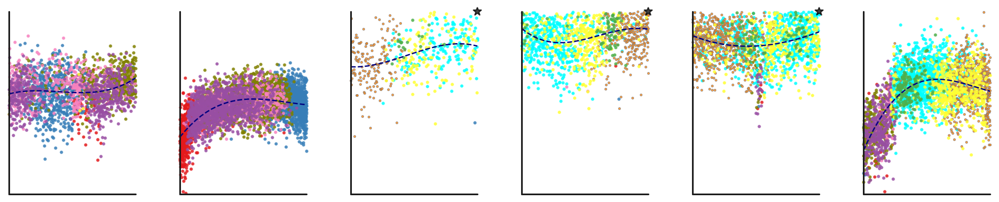

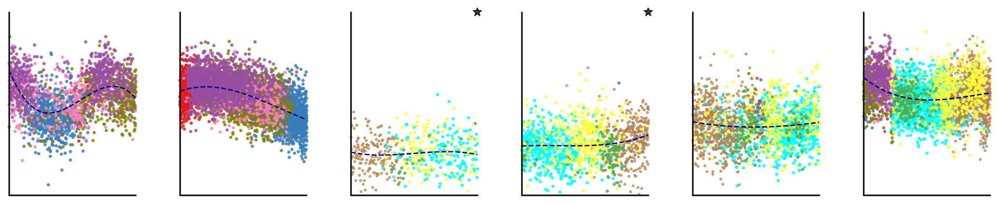

In [4]:
def plotPdotInv(l='', d=None, vmax=3.5, figsize=(16, 10), gene='CCND1', ads_sel=None, timepoints=['TC', 'T0', 'T1', 'T2', 'T3', 'T4'], xmin=-0.2, ms=3., palette=None, xmax=0.5, title_shift=0.075, equal_height=True):
    
    def splitTextToRows(txt, maxl=20):
    
        txt = txt.replace('_', ' ').split(' ')
        maxl = max(max([len(t) for t in txt]), maxl)

        chunks = []
        temp_chunk = ''
        for t in txt:
            if len(temp_chunk + t) + 1 < maxl:
                temp_chunk += t + ' '
            else:
                chunks.append(temp_chunk.strip(' '))
                temp_chunk = t
        chunks.append(temp_chunk.strip(' '))

        return '\n'.join(chunks)

    fig, axs = plt.subplots(1, len(timepoints), figsize=figsize, gridspec_kw={'width_ratios': [1.00]*len(timepoints)})
    
    for itimepoint, timepoint in enumerate(timepoints[:]):
        if ads_sel is None:
            ad_sel = sc.read(dataPath + f'ad_sel_ordered_{model}_{timepoint}.h5ad')
        else:
            ad_sel = ads_sel[timepoint]
        if gene in ad_sel.var.index:
            seC = ad_sel[:, gene].to_df()[gene]
        else:
            seC = ad_sel.obs[f'score_{gene}']

        cmin, cmax = seC.quantile(0.05), seC.quantile(0.95)

        score_genes(ad_sel, gene_list=ad_sel.var.index.intersection(genesDicts[l]), score_name=f'score_{l}', ctrl_size=50)
        if not d is None:
            score_genes(ad_sel, gene_list=ad_sel.var.index.intersection(genesDicts[d]), score_name=f'score_{d}', ctrl_size=50)
            ad_sel.obs[f'score_{l}_over_{d}'] = np.log(ad_sel.obs[f'score_{l}'] / ad_sel.obs[f'score_{d}'])
        
        t = ad_sel.obs['t']
        order = np.argsort(t)[::-1].values
        clusters_ordered = ad_sel.obs['cluster'].iloc[order]
        
        tlow, thigh = t.min(), t.max()
        
        if equal_height:
            tlow, thigh = 0, vmax
        else:
            tlow, thigh = cmin, cmax

        nbins = 20
        alpha = 0.75
        
        ax = axs[itimepoint]
        if True:
            if d is None:
                se_score = ad_sel.obs[f'score_{l}'].iloc[order]
            else:
                se_score = ad_sel.obs[f'score_{l}_over_{d}'].iloc[order]

            if itimepoint == 0:
                #txt = f'{l}'.replace('_', ' ').replace(' ', '\n')
                if not d is None:
                    txt = splitTextToRows(f'log({l} / {d})')
                else:
                    txt = splitTextToRows(f'{l}')
                
                ##ax.text(tlow, xmax - 0.5 * (xmax - xmin), txt, fontsize=10, ha='right', va='center', rotation=90)
                #ax.set_ylabel(txt, fontsize=10)
                

            uclusters = sorted(clusters_ordered.unique())
            
            star = False
            for cluster in uclusters:
                cond = clusters_ordered==cluster
                cond_out = (se_score.values < xmin) | (se_score.values > xmax)
                if cond_out.sum()>0:
                    #print(timepoint, cond_out.sum(), 'clipped')
                    star = True
                wh = np.where(cond & ~cond_out)[0]
                X, Y = se_score.values[wh], np.linspace(tlow, thigh, len(se_score))[wh]
                mec = 'grey' if cluster=='4' else None
                mew = 0.5 if cluster=='4' else None
                ax.plot(Y, X, 'o', c=palette[cluster], alpha=alpha, zorder=-1, ms=ms, mec=mec, mew=mew, clip_on=False)
                
            X, Y = se_score.values, np.linspace(tlow, thigh, len(se_score))
            ax.plot(*np.polynomial.Polynomial.fit(Y, X, 3).linspace(25), '--', color='navy')
            
            if star:
                ax.plot([vmax], [xmax], '*', c='black', alpha=alpha, zorder=-1, ms=8, clip_on=False)
            
            ax.plot([tlow, tlow], [xmin, xmax], ls='-', color='k', lw=1.5, clip_on=False)
            ax.plot([tlow, thigh], [xmin, xmin], ls='-', color='k', lw=1.5, clip_on=False)
            
            xshift = (thigh - tlow)*0.025
            yshift = (xmax - xmin)*0.01
            
            #ax.text(tlow + 0.5 * (thigh - tlow), xmin - 2 * yshift, 'Ordering', fontsize=10, ha='center', va='top', rotation=0)
            ax.set_xticks([])
            
            ##ax.text(tlow - xshift, xmin, xmin, ha='right', va='bottom', fontsize=12)
            #ax.text(tlow, xmin - yshift, 0., ha='center', va='top', fontsize=12)
            #ax.text(thigh, xmin - yshift, thigh, ha='center', va='top', fontsize=12)
            ##ax.text(0.5 * (tlow + thigh), xmax, timepoint, ha='center', va='bottom', fontsize=16)
            ##ax.text(tlow - xshift, xmax, xmax, ha='right', va='top', fontsize=12)
            ax.set_xlim([0, thigh])
            ax.set_ylim([xmin, xmax])
            
        ax.axis('off')
    
    plt.subplots_adjust(wspace=0.35)
    plt.show()
    return

plt.rcParams['figure.dpi'] = 150
plotPdotInv(l='WP_GLYCOLYSIS_AND_GLUCONEOGENESIS', d='OXPHOS', gene='HOEK_INVASIVE', figsize=(16, 3), vmax=1.0, xmin=-2., xmax=0., ms=2., equal_height=True, palette=palette_rna, ads_sel=ads_sel)
plotPdotInv(l='HOEK_INVASIVE', gene='HOEK_INVASIVE', figsize=(16, 3), vmax=1.0, xmin=0.1, xmax=1.1, ms=2., equal_height=True, palette=palette_rna, ads_sel=ads_sel)
plotPdotInv(l='CELL_CYCLE', gene='HOEK_INVASIVE', figsize=(16, 3), vmax=1.0, xmin=-0.1, xmax=0.5, ms=2., equal_height=True, palette=palette_rna, ads_sel=ads_sel)
plt.rcParams['figure.dpi'] = 75

# plotPdotInv(l='RIBOSOMAL', gene='HOEK_INVASIVE', figsize=(16, 3), vmax=1.0, xmin=0.5, xmax=2, ms=2., equal_height=True, palette=palette_rna, ads_sel=ads_sel)
# plotPdotInv(l='KEGG_LYSOSOME', gene='HOEK_INVASIVE', figsize=(16, 3), vmax=1.0, xmin=-0., xmax=1, ms=2., equal_height=True, palette=palette_rna, ads_sel=ads_sel)
# plotPdotInv(l='BIOCARTA_P53HYPOXIA_PATHWAY', gene='HOEK_INVASIVE', figsize=(16, 3), vmax=1.0, xmin=-1, xmax=1, ms=2., equal_height=True, palette=palette_rna, ads_sel=ads_sel)